# GSM8594567_P1CRC

In [1]:
import scanpy as sc
import pandas as pd
import gzip
import json
import pyarrow.parquet as pq
import io
from PIL import Image
import tifffile as tiff
import numpy as np

# 파일 경로 설정
sample_id = "GSM8594567_P1CRC"
data_dir = "/home/Data_Drive_8TB/kykim/2. CRC/CRC2/Spatial_rawdata/Tumor"

# 1. Expression matrix (.h5)
adata = sc.read_10x_h5(f"{data_dir}/{sample_id}_filtered_feature_bc_matrix.h5")
adata.var_names_make_unique()

# 2. Tissue positions (.parquet.gz) - gzip + BytesIO 방식
with gzip.open(f"{data_dir}/{sample_id}_tissue_positions.parquet.gz", 'rb') as f:
    file_content = f.read()

buffer = io.BytesIO(file_content)
tissue_positions = pq.read_table(buffer).to_pandas()

# 3. 열 이름 지정 및 정리
tissue_positions.columns = [
    'barcode', 'in_tissue', 'array_row', 'array_col',
    'pxl_row_in_fullres', 'pxl_col_in_fullres'
]
tissue_positions.set_index('barcode', inplace=True)

# 4. Join with adata.obs
adata.obs = adata.obs.join(tissue_positions, how="left")

# 5. 공간 좌표 저장
adata.obsm['spatial'] = adata.obs[['pxl_row_in_fullres', 'pxl_col_in_fullres']].to_numpy()



# Image adding
image_path = f"{data_dir}/{sample_id}_tissue_lowres_image.png.gz"

# gzip 압축 해제 후 이미지 로딩
with gzip.open(image_path, 'rb') as f:
    img = Image.open(io.BytesIO(f.read()))
    img = img.convert("RGB")

img_array = np.array(img)

# 이미지 adata에 연결
adata.uns["spatial"] = {
    sample_id: {
        "images": {
            "lowres": img_array
        },
        "scalefactors": {},  # scalefactors 넣고 싶으면 json.gz 파일 파싱 필요
        "metadata": {}
    }
}

/home/Data_Drive_8TB/kykim/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/Data_Drive_8TB/kykim/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [2]:
import gzip
import shutil

with gzip.open("/home/Data_Drive_8TB/kykim/2. CRC/CRC2/Spatial_rawdata/Tumor/GSM8594567_P1CRC_Metadata.parquet.gz", "rb") as f_in:
    with open("GSM8594567_P1CRC_Metadata.parquet", "wb") as f_out:
        shutil.copyfileobj(f_in, f_out)

# 이제 읽기
import pandas as pd
df = pd.read_parquet("GSM8594567_P1CRC_Metadata.parquet", engine="fastparquet")

In [3]:
adata.var_names_make_unique()
adata.var["mt"] = adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

<Axes: xlabel='n_genes_by_counts', ylabel='Count'>

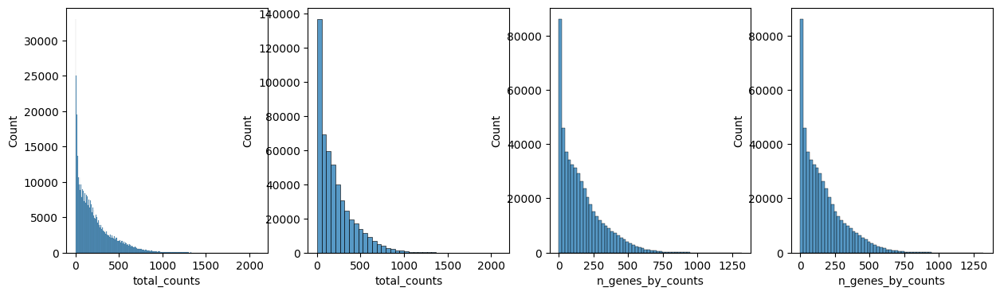

In [4]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

fig, axs = plt.subplots(1, 4, figsize=(15, 4))
sns.histplot(adata.obs["total_counts"], kde=False, ax=axs[0])
sns.histplot(
    adata.obs["total_counts"],
    kde=False,
    bins=40,
    ax=axs[1],
)
sns.histplot(adata.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[2])
sns.histplot(
    adata.obs["n_genes_by_counts"],
    kde=False,
    bins=60,
    ax=axs[3],
)

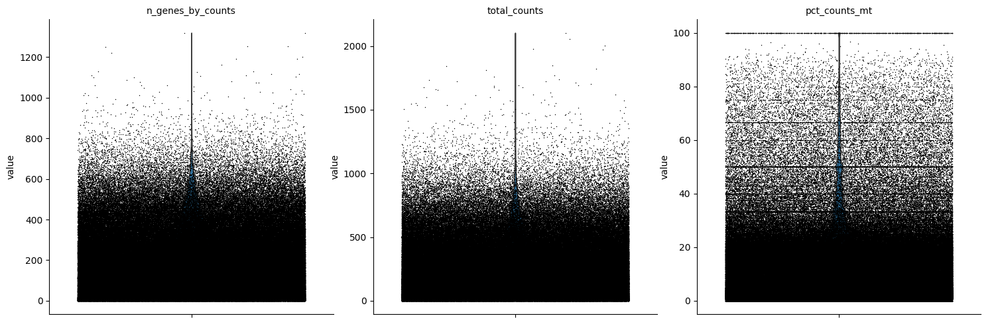

In [5]:
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True,
)

AnnData object with n_obs × n_vars = 506084 × 18085
    obs: 'in_tissue', 'array_row', 'array_col', 'pxl_row_in_fullres', 'pxl_col_in_fullres', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'spatial', 'log1p', 'hvg'
    obsm: 'spatial'


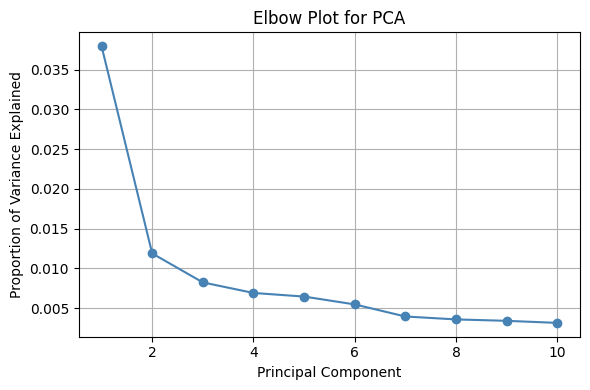

In [6]:
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e6)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, n_top_genes=5000)
# adata = adata[:, adata.var['highly_variable']]
print(adata)
# 2. PCA
sc.pp.pca(adata, n_comps=10)  # elbow plot 위해 더 크게 잡는 게 좋음

# 3. Elbow plot (variance explained)
plt.figure(figsize=(6, 4))
x = np.arange(1, len(adata.uns["pca"]["variance_ratio"]) + 1)
y = adata.uns["pca"]["variance_ratio"]
plt.plot(x, y, marker="o", color="steelblue")
plt.xlabel("Principal Component")
plt.ylabel("Proportion of Variance Explained")
plt.title("Elbow Plot for PCA")
plt.grid(True)
plt.tight_layout()
plt.show()


In [7]:
sc.pp.neighbors(adata)
sc.tl.umap(adata)

2025-08-05 03:37:48.167824: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1754332668.289755 3568978 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1754332668.323323 3568978 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1754332668.568977 3568978 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1754332668.569021 3568978 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1754332668.569023 3568978 computation_placer.cc:177] computation placer alr

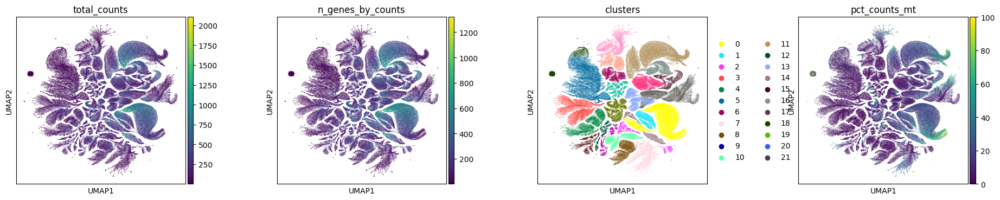

In [8]:
sc.tl.leiden(
    adata,
    key_added="clusters",
    resolution=0.05,
    n_iterations=2,
    flavor="igraph",
    directed=False,
)
plt.rcParams["figure.figsize"] = (4, 4)
sc.pl.umap(adata, color=["total_counts", "n_genes_by_counts", "clusters","pct_counts_mt"], wspace=0.4)

/home/Data_Drive_8TB/kykim/.local/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:429: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/home/Data_Drive_8TB/kykim/.local/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:431: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/home/Data_Drive_8TB/kykim/.local/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:434: Performanc

Cluster 0: ['MT-ND6', 'MT-ND2', 'MT-ATP6', 'MT-CO3', 'MT-CO2', 'MT-ND4', 'MT-CYB', 'MT-ND4L', 'MT-ND3', 'MT-ND1', 'OLFM4', 'TSPAN8', 'CEACAM5', 'KRT8', 'S100A6']
Cluster 1: ['MT-ND6', 'MT-ND2', 'MT-ATP6', 'MT-CO3', 'MT-ND4', 'MT-CO2', 'MT-CYB', 'MT-ND4L', 'MT-ND3', 'TMSB4X', 'MT-ND1', 'COL3A1', 'TSPAN8', 'OLFM4', 'S100A6']
Cluster 2: ['MT-ND2', 'MT-CO3', 'VIM', 'COL3A1', 'COL1A2', 'IGKC', 'COL1A1', 'CD74', 'SPARC', 'MMP2', 'A2M', 'C1S', 'C3', 'LUM', 'COL6A2']
Cluster 3: ['COL3A1', 'COL1A1', 'COL1A2', 'MMP2', 'C3', 'DCN', 'COL6A3', 'SFRP2', 'SPARC', 'MGP', 'LUM', 'VIM', 'FBLN1', 'CCDC80', 'C1S']
Cluster 4: ['IGKC', 'IGHG1', 'JCHAIN', 'MMP2', 'VIM', 'C3', 'COL3A1', 'COL1A1', 'IGHA1', 'COL1A2', 'PTGDS', 'CXCR4', 'SFRP2', 'MGP', 'DCN']
Cluster 5: ['DES', 'MYH11', 'ACTG2', 'SYNM', 'TAGLN', 'CNN1', 'SYNPO2', 'MYLK', 'MYL9', 'TPM2', 'TNS1', 'LMOD1', 'HSPB6', 'PRND', 'MARCOL']
Cluster 6: ['IGKC', 'MT-ATP6', 'IGHG1', 'JCHAIN', 'VIM', 'COL3A1', 'C3', 'CD74', 'MMP2', 'CXCR4', 'IGHA1', 'COL1A2', '

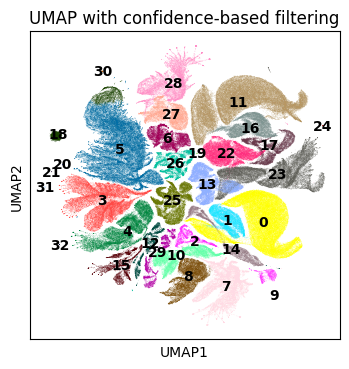

In [9]:
import scanpy as sc
sc.tl.rank_genes_groups(adata, groupby='clusters', method='t-test')  # 또는 'wilcoxon'

top_genes = {}

groups = adata.uns['rank_genes_groups']['names'].dtype.names  # 클러스터 이름들

for group in groups:
    genes = adata.uns['rank_genes_groups']['names'][group][:15]
    top_genes[group] = genes.tolist()

# 결과 확인
for cluster, genes in top_genes.items():
    print(f"Cluster {cluster}: {genes}")
sc.pl.umap(
    adata,
    color='clusters',
    title='UMAP with confidence-based filtering',
    legend_loc='on data'  # 또는 'right margin', 'none'
)


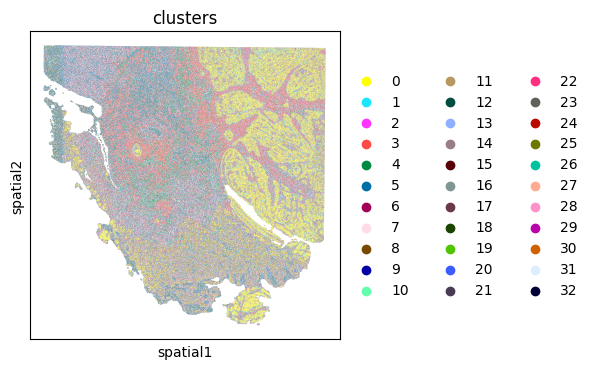

In [10]:
sc.pl.embedding(adata, basis="spatial", color="clusters")

In [11]:
# 클러스터별 소분류 및 대분류 정의
subtype_map = {
    0: ("Epithelial", "Goblet"),
    12: ("Epithelial", "Goblet"),
    13: ("Epithelial", "Goblet"),
    15: ("Epithelial", "Goblet"),
    10: ("Epithelial", "Colonocyte / Enterocyte"),
    14: ("Epithelial", "Colonocyte / Enterocyte"),
    16: ("Epithelial", "Goblet + Plasma Hybrid"),
    1: ("Smooth Muscle", "Smooth Muscle"),
    21: ("Smooth Muscle", "Smooth or Male-specific"),
    3: ("Immune", "Plasma / B cell"),
    9: ("Immune", "Fibro-Immune Hybrid"),
    4: ("Stromal / Fibro", "Fibroblast"),
    5: ("Stromal / Fibro", "Stromal-Epi Hybrid"),
    11: ("Stromal / Fibro", "Activated Fibroblast"),
    2: ("Unknown", "Unknown"),
    19: ("Unknown", "Unknown"),
    6: ("Unknown", "Unknown"),
    7: ("Unknown", "Unknown"),
    8: ("Unknown", "Unknown"),
    17: ("Unknown", "Unknown"),
    18: ("Unknown", "Unknown"),
    20: ("Unknown", "Unknown"),
    22: ("Unknown", "Unknown"),
}

# 기본값 지정
adata.obs["Major_annotation"] = "Unassigned"
adata.obs["Sub_annotation"] = "Unassigned"

# 클러스터 기준으로 값 할당
for cluster, (major, sub) in subtype_map.items():
    mask = adata.obs["clusters"] == str(cluster)  # 문자열형 클러스터 라벨일 경우
    adata.obs.loc[mask, "Major_annotation"] = major
    adata.obs.loc[mask, "Sub_annotation"] = sub


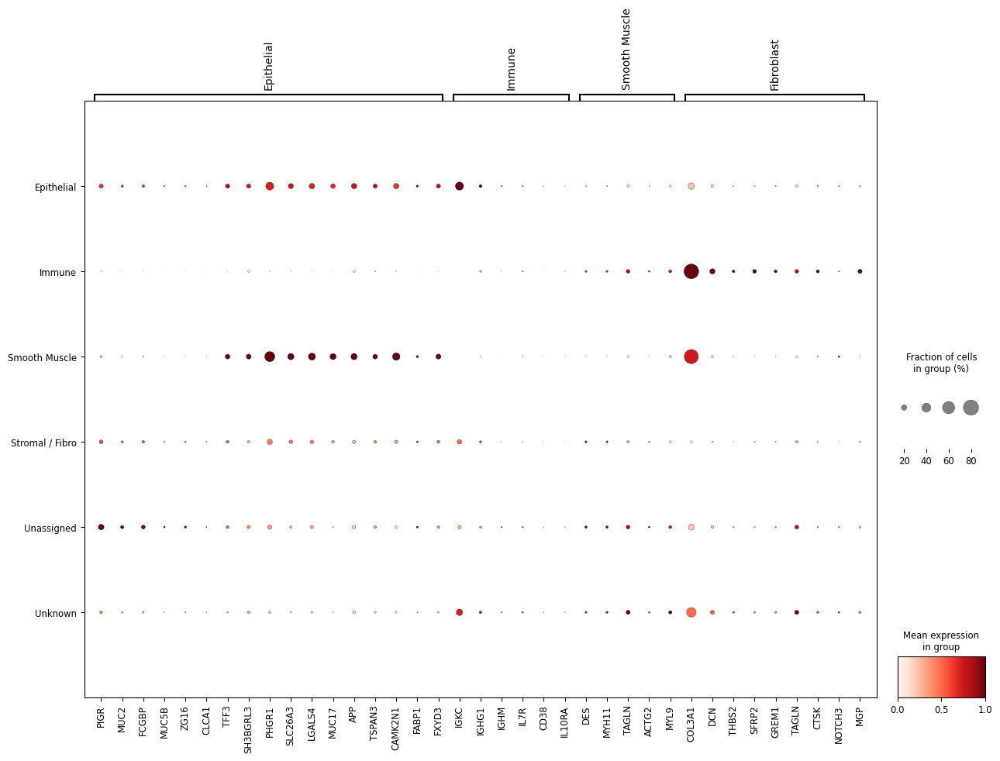

In [12]:
# 클러스터별 주요 마커 유전자 요약 (표 기반)
cluster_markers_major = {
    "Epithelial": [
        'PIGR', 'MUC2', 'FCGBP', 'MUC5B', 'ZG16', 'CLCA1', 'TFF3', 'SH3BGRL3',
        'PHGR1', 'SLC26A3', 'LGALS4', 'MUC17', 'APP', 'TSPAN3', 'CAMK2N1', 'FABP1',
        'FXYD3'
    ],
    "Immune": ['IGKC', 'IGHG1', 'IGHM', 'IL7R', 'CD38', 'IL10RA'],
    "Smooth Muscle": ['DES', 'MYH11', 'TAGLN', 'ACTG2', 'MYL9'],

    "Fibroblast": ['COL3A1', 'DCN', 'THBS2', 'SFRP2', 'GREM1', 'TAGLN', 'CTSK', 'NOTCH3', 'MGP'],
}


# 실제 adata에 존재하는 유전자만 필터링
existing_genes = {
    cluster: [gene for gene in genes if gene in adata.var_names]
    for cluster, genes in cluster_markers_major.items()
}
existing_genes = {k: v for k, v in existing_genes.items() if v}

# 도트플롯 시각화
sc.pl.dotplot(
    adata,
    var_names=existing_genes,
    groupby="Major_annotation",  # 클러스터 컬럼명 (필요 시 "clusters"나 다른 이름으로 변경)
    standard_scale="var",
    swap_axes=False,
    dendrogram=False,
    figsize=(15, 10)
)


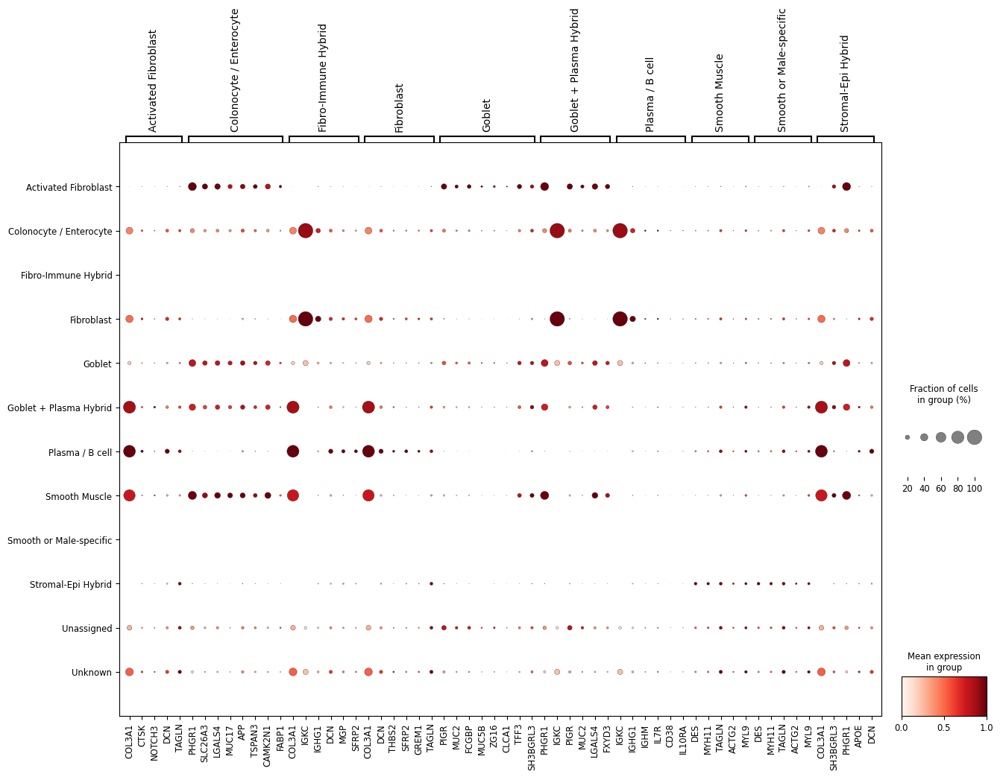

In [13]:
# 클러스터별 주요 마커 유전자 요약 (표 기반)
cluster_markers_fine = {
    "Activated Fibroblast": ['COL3A1', 'CTSK', 'NOTCH3', 'DCN', 'TAGLN'],
    "Colonocyte / Enterocyte": ['PHGR1', 'SLC26A3', 'LGALS4', 'MUC17', 'APP', 'TSPAN3', 'CAMK2N1', 'FABP1'],
    "Fibro-Immune Hybrid": ['COL3A1', 'IGKC', 'IGHG1', 'DCN', 'MGP', 'SFRP2'],
    "Fibroblast": ['COL3A1', 'DCN', 'THBS2', 'SFRP2', 'GREM1', 'TAGLN'],
    "Goblet": ['PIGR', 'MUC2', 'FCGBP', 'MUC5B', 'ZG16', 'CLCA1', 'TFF3', 'SH3BGRL3'],
    "Goblet + Plasma Hybrid": ['PHGR1', 'IGKC', 'PIGR', 'MUC2', 'LGALS4', 'FXYD3'],
    
    "Plasma / B cell": ['IGKC', 'IGHG1', 'IGHM', 'IL7R', 'CD38', 'IL10RA'],



    
    "Smooth Muscle": ['DES', 'MYH11', 'TAGLN', 'ACTG2', 'MYL9'],
    "Smooth or Male-specific": ['DES', 'MYH11', 'TAGLN', 'ACTG2', 'MYL9'],



    "Stromal-Epi Hybrid": ['COL3A1', 'SH3BGRL3', 'PHGR1', 'APOE', 'DCN'],

    "Unknown": []  # 클러스터 2, 6–8, 17–20, 22에 대해 별도 정의 필요 시 추가 가능
}

# 실제 adata에 존재하는 유전자만 필터링
existing_genes = {
    cluster: [gene for gene in genes if gene in adata.var_names]
    for cluster, genes in cluster_markers_fine.items()
}
existing_genes = {k: v for k, v in existing_genes.items() if v}

# 도트플롯 시각화
sc.pl.dotplot(
    adata,
    var_names=existing_genes,
    groupby="Sub_annotation",  # 클러스터 컬럼명 (필요 시 "clusters"나 다른 이름으로 변경)
    standard_scale="var",
    swap_axes=False,
    dendrogram=False,
    figsize=(15, 10)
)


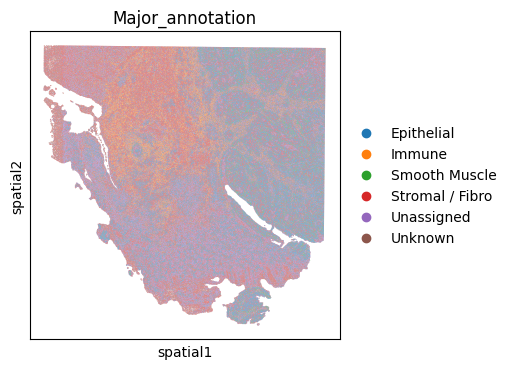

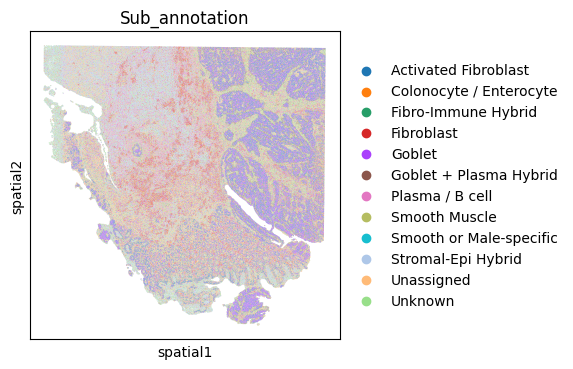

In [14]:
sc.pl.embedding(adata, basis="spatial", color="Major_annotation")
sc.pl.embedding(adata, basis="spatial", color="Sub_annotation")

In [15]:
df_indexed = df.set_index("barcode")
common_barcodes = adata.obs.index.intersection(df_indexed.index)
adata.obs = adata.obs.loc[common_barcodes]
df_matched = df_indexed.loc[common_barcodes]
adata.obs = adata.obs.join(df_matched)


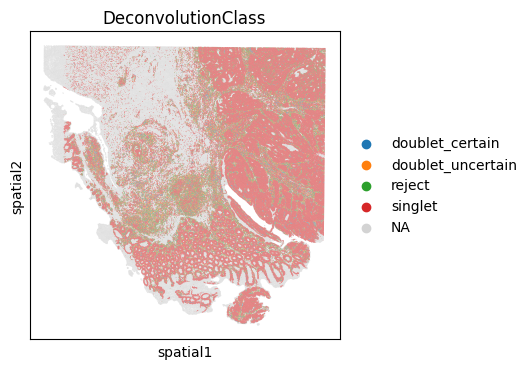

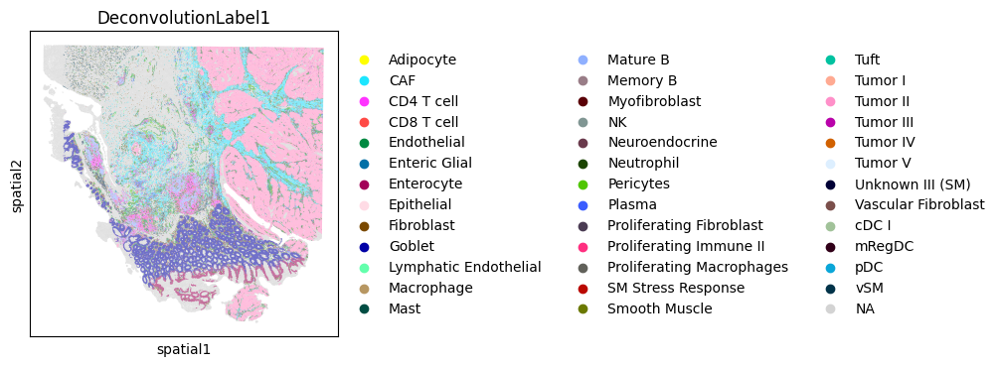

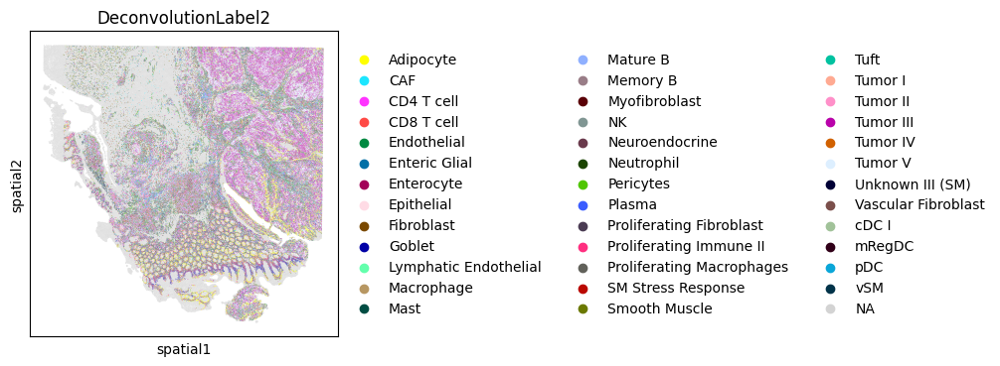

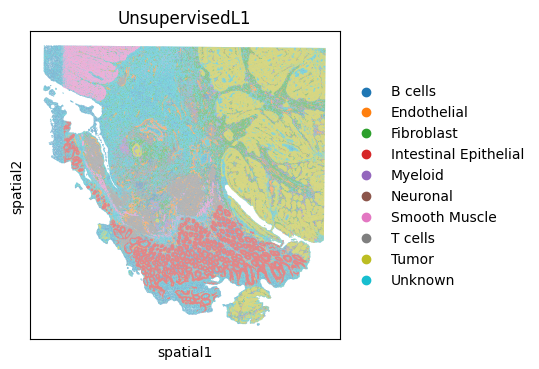

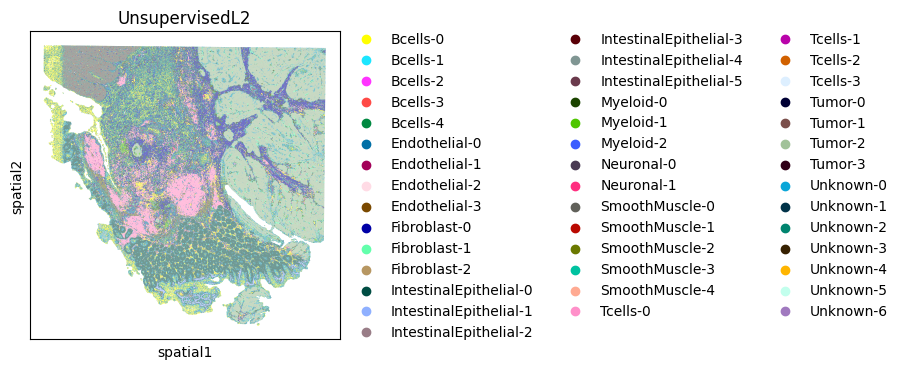

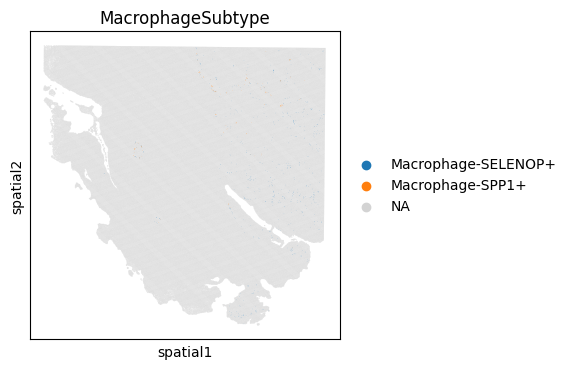

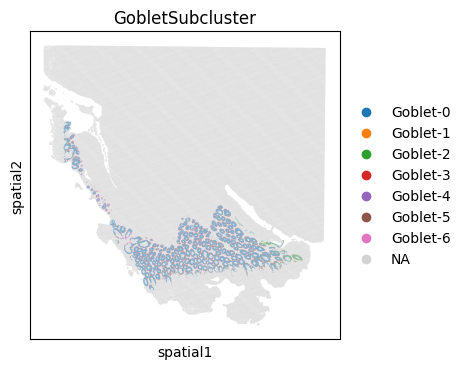

In [16]:
sc.pl.embedding(adata, basis="spatial", color="DeconvolutionClass")
sc.pl.embedding(adata, basis="spatial", color="DeconvolutionLabel1")
sc.pl.embedding(adata, basis="spatial", color="DeconvolutionLabel2")
sc.pl.embedding(adata, basis="spatial", color="UnsupervisedL1")
sc.pl.embedding(adata, basis="spatial", color="UnsupervisedL2")
sc.pl.embedding(adata, basis="spatial", color="MacrophageSubtype")
sc.pl.embedding(adata, basis="spatial", color="GobletSubcluster")

# Down resol

📌 Step 1: 좌표 정보 및 평균 spot 간격 계산
   ⤷ 평균 spot 간격 (좌표 단위, 참고용): 0.03923
   ⤷ microns_per_pixel (json 값): 0.27381
   ⤷ 계산된 bin 크기 (좌표 기준, bin_um=60 µm): 219.1
📌 Step 2: 격자 생성 및 bin_id 할당
   ⤷ 생성된 bin 수: 9465
📌 Step 3: bin 단위 집계 수행 중...
   ⤷ 0 / 9465 bin 처리 완료
   ⤷ 500 / 9465 bin 처리 완료
   ⤷ 1000 / 9465 bin 처리 완료
   ⤷ 1500 / 9465 bin 처리 완료
   ⤷ 2000 / 9465 bin 처리 완료
   ⤷ 2500 / 9465 bin 처리 완료
   ⤷ 3000 / 9465 bin 처리 완료
   ⤷ 3500 / 9465 bin 처리 완료
   ⤷ 4000 / 9465 bin 처리 완료
   ⤷ 4500 / 9465 bin 처리 완료
   ⤷ 5000 / 9465 bin 처리 완료
   ⤷ 5500 / 9465 bin 처리 완료
   ⤷ 6000 / 9465 bin 처리 완료
   ⤷ 6500 / 9465 bin 처리 완료
   ⤷ 7000 / 9465 bin 처리 완료
   ⤷ 7500 / 9465 bin 처리 완료
   ⤷ 8000 / 9465 bin 처리 완료
   ⤷ 8500 / 9465 bin 처리 완료
   ⤷ 9000 / 9465 bin 처리 완료
📌 Step 4: 새로운 AnnData 객체 생성
✅ Downsampling 완료
   ⤷ 원본 크기: (506084, 18085)
   ⤷ 다운샘플된 크기: (9465, 18085)
📌 Step 5: 다운샘플링 통계 계산
   ⤷ 원본 바코드 수: 506,084
   ⤷ bin 개수: 9,465
   ⤷ 다운샘플링 배율: 53.47배
📌 Step 6: bin당 barcode 수 통계
count    9465.000000
mean       53.468991

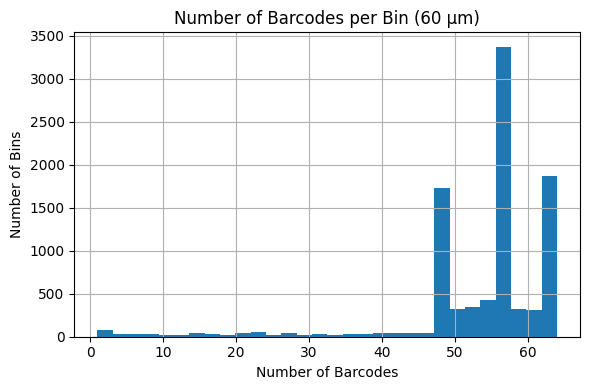

In [17]:
import numpy as np
import pandas as pd
from scipy.sparse import issparse, vstack, csr_matrix
import scanpy as sc
import matplotlib.pyplot as plt

print("📌 Step 1: 좌표 정보 및 평균 spot 간격 계산")
spatial = adata.obsm["spatial"]
x, y = spatial[:, 0], spatial[:, 1]

x_step = np.median(np.diff(np.sort(np.unique(x))))
y_step = np.median(np.diff(np.sort(np.unique(y))))
mean_step = (x_step + y_step) / 2

# JSON에서 가져온 microns_per_pixel 값 (직접 수정 또는 JSON에서 로드)
microns_per_pixel = 0.27380817798463214  # 실제 데이터에 맞게 바꿔주세요

########## resolution input is um ##########
bin_um = 60  # 원하는 bin 크기 (µm)

# bin_px 계산 수정: microns_per_pixel 기준으로 계산
bin_px = bin_um / microns_per_pixel

print(f"   ⤷ 평균 spot 간격 (좌표 단위, 참고용): {mean_step:.5f}")
print(f"   ⤷ microns_per_pixel (json 값): {microns_per_pixel:.5f}")
print(f"   ⤷ 계산된 bin 크기 (좌표 기준, bin_um={bin_um} µm): {bin_px:.1f}")

print("📌 Step 2: 격자 생성 및 bin_id 할당")
x_bins = np.arange(x.min(), x.max() + bin_px, bin_px)
y_bins = np.arange(y.min(), y.max() + bin_px, bin_px)

x_bin_idx = np.digitize(x, x_bins) - 1
y_bin_idx = np.digitize(y, y_bins) - 1

bin_keys = [f"{i}_{j}" for i, j in zip(x_bin_idx, y_bin_idx)]
adata.obs["bin_id"] = bin_keys

grouped = adata.obs.groupby("bin_id").indices
print(f"   ⤷ 생성된 bin 수: {len(grouped)}")

meta_cols = [
    "DeconvolutionClass", "DeconvolutionLabel1", "DeconvolutionLabel2",
    "Periphery", "UnsupervisedL1", "UnsupervisedL2",
    "MacrophageSubtype", "GobletSubcluster"
]

print("📌 Step 3: bin 단위 집계 수행 중...")
X = adata.X.tocsr() if issparse(adata.X) else adata.X

new_X = []
new_obs = []
new_spatial = []

for i, (bin_id, indices) in enumerate(grouped.items()):
    if len(indices) == 0:
        continue

    expr_sum = X[indices].sum(axis=0)
    expr_sum = csr_matrix(expr_sum)  # 1xN sparse row

    bin_obs = adata.obs.iloc[indices][meta_cols]
    mode_values = bin_obs.mode().iloc[0]

    center_coord = spatial[indices].mean(axis=0)

    new_X.append(expr_sum)
    new_obs.append(mode_values)
    new_spatial.append(center_coord)

    if i % 500 == 0:
        print(f"   ⤷ {i} / {len(grouped)} bin 처리 완료")

print("📌 Step 4: 새로운 AnnData 객체 생성")
new_X = vstack(new_X)

new_obs_df = pd.DataFrame(new_obs).set_index(pd.Index(grouped.keys()))
new_obs_df.index.name = "binned_barcode"

adata_low = sc.AnnData(
    X=new_X,
    obs=new_obs_df,
    var=adata.var.copy()
)
adata_low.obsm["spatial"] = np.vstack(new_spatial)

print("✅ Downsampling 완료")
print(f"   ⤷ 원본 크기: {adata.shape}")
print(f"   ⤷ 다운샘플된 크기: {adata_low.shape}")

print("📌 Step 5: 다운샘플링 통계 계산")
original_n_spots = adata.shape[0]
binned_n_spots = adata_low.shape[0]
downsampling_factor = original_n_spots / binned_n_spots

print(f"   ⤷ 원본 바코드 수: {original_n_spots:,}")
print(f"   ⤷ bin 개수: {binned_n_spots:,}")
print(f"   ⤷ 다운샘플링 배율: {downsampling_factor:.2f}배")

barcode_counts_per_bin = [len(indices) for indices in grouped.values() if len(indices) > 0]
barcode_counts_series = pd.Series(barcode_counts_per_bin, name="barcodes_per_bin")

print("📌 Step 6: bin당 barcode 수 통계")
print(barcode_counts_series.describe(percentiles=[0.1, 0.25, 0.5, 0.75, 0.9]))

plt.figure(figsize=(6,4))
barcode_counts_series.hist(bins=30)
plt.title(f"Number of Barcodes per Bin ({bin_um} µm)")
plt.xlabel("Number of Barcodes")
plt.ylabel("Number of Bins")
plt.tight_layout()
plt.show()


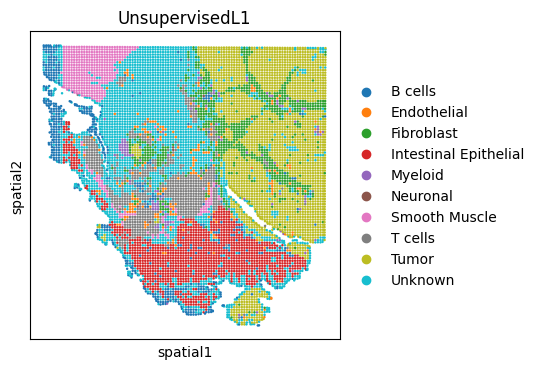

In [18]:
sc.pl.embedding(adata_low, basis="spatial", color="UnsupervisedL1")

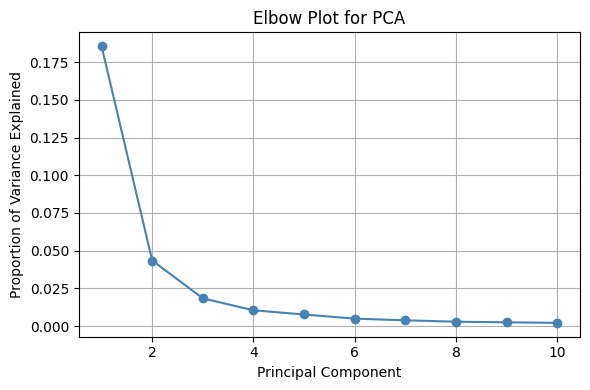

In [19]:
sc.pp.normalize_per_cell(adata_low, counts_per_cell_after=1e6)
sc.pp.log1p(adata_low)

# 2. PCA
sc.pp.pca(adata_low, n_comps=10)  # elbow plot 위해 더 크게 잡는 게 좋음

# 3. Elbow plot (variance explained)
plt.figure(figsize=(6, 4))
x = np.arange(1, len(adata_low.uns["pca"]["variance_ratio"]) + 1)
y = adata_low.uns["pca"]["variance_ratio"]
plt.plot(x, y, marker="o", color="steelblue")
plt.xlabel("Principal Component")
plt.ylabel("Proportion of Variance Explained")
plt.title("Elbow Plot for PCA")
plt.grid(True)
plt.tight_layout()
plt.show()


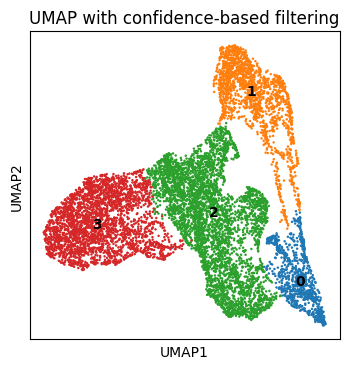

In [20]:
sc.pp.neighbors(adata_low)
sc.tl.umap(adata_low)
sc.tl.leiden(
    adata_low,
    key_added="clusters",
    resolution=0.05,
    n_iterations=2,
    flavor="igraph",
    directed=False,
)
sc.pl.umap(
    adata_low,
    color='clusters',
    title='UMAP with confidence-based filtering',
    legend_loc='on data'  # 또는 'right margin', 'none'
)


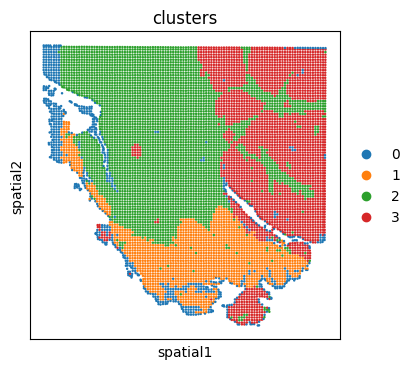

In [21]:
sc.pl.embedding(adata_low, basis="spatial", color="clusters")

In [22]:
# 1. Convert to DataFrame (sparse-safe)
df_expr = pd.DataFrame.sparse.from_spmatrix(
    adata_low.X,
    index=adata_low.obs_names,      # rows: bins
    columns=adata_low.var_names     # columns: gene symbols
)

# 2. Transpose: genes → rows, bins → columns
df_expr_T = df_expr.T.copy()

# 3. Add gene names as column
df_expr_T.insert(0, "Gene.Symbol", df_expr_T.index)

# 4. Reset index if needed (optional)
df_expr_T.reset_index(drop=True, inplace=True)

In [23]:
# 1. 유전자 이름 열 분리
gene_symbol_col = df_expr_T["Gene.Symbol"]

# 2. 나머지 수치형 데이터만 dense로 변환
df_dense_part = df_expr_T.drop(columns="Gene.Symbol").sparse.to_dense()

# 3. 다시 gene symbol을 제일 앞 열로 붙이기
df_expr_T_dense = pd.concat([gene_symbol_col.reset_index(drop=True), df_dense_part.reset_index(drop=True)], axis=1)
df_expr_T_dense.columns = ["Gene.Symbol"] + df_dense_part.columns.tolist()

# 4. Parquet 저장
output_path_parquet = "/home/Data_Drive_8TB/kykim/2. CRC/CRC2/PDSclassifier/ST_GSM8594567_P1CRC_60um_matrix.parquet"
df_expr_T_dense.to_parquet(output_path_parquet, index=False,engine="fastparquet")

print(f"✅ Parquet 저장 완료: {output_path_parquet}")

✅ Parquet 저장 완료: /home/Data_Drive_8TB/kykim/2. CRC/CRC2/PDSclassifier/ST_GSM8594567_P1CRC_60um_matrix.parquet


# PDS classifier

In [24]:
import pandas as pd

# 파일 경로
file_path = "/home/Data_Drive_8TB/kykim/2. CRC/CRC2/PDSclassifier/ST_GSM8594567_P1CRC_60um.parquet"

# parquet 파일 읽기
df = pd.read_parquet(file_path,engine="fastparquet")

In [25]:
df

,Sample_ID,PDS1,PDS2,PDS3,prediction,PDS_call
0,0_100,0.004735,0.012628,0.982637,PDS3,PDS3
1,0_101,0.007137,0.023264,0.969599,PDS3,PDS3
2,0_102,0.004875,0.019016,0.976109,PDS3,PDS3
3,0_103,0.004909,0.016025,0.979066,PDS3,PDS3
4,0_104,0.003727,0.013054,0.983218,PDS3,PDS3
...,...,...,...,...,...,...
9460,9_95,0.006204,0.013663,0.980132,PDS3,PDS3
9461,9_96,0.006106,0.025674,0.968220,PDS3,PDS3
9462,9_97,0.007784,0.033515,0.958702,PDS3,PDS3
9463,9_98,0.003079,0.023831,0.973090,PDS3,PDS3


In [26]:
df_indexed = df.set_index("Sample_ID")
adata_low.obs["PDS1"] = adata_low.obs.index.map(df_indexed["PDS1"])
adata_low.obs["PDS2"] = adata_low.obs.index.map(df_indexed["PDS2"])
adata_low.obs["PDS3"] = adata_low.obs.index.map(df_indexed["PDS3"])
adata_low.obs["PDS"] = adata_low.obs.index.map(df_indexed["PDS_call"])

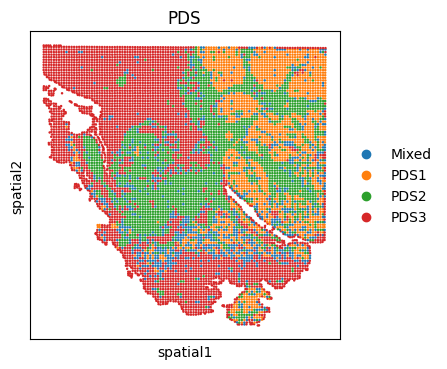

In [27]:
sc.pl.embedding(adata_low, basis="spatial", color="PDS")

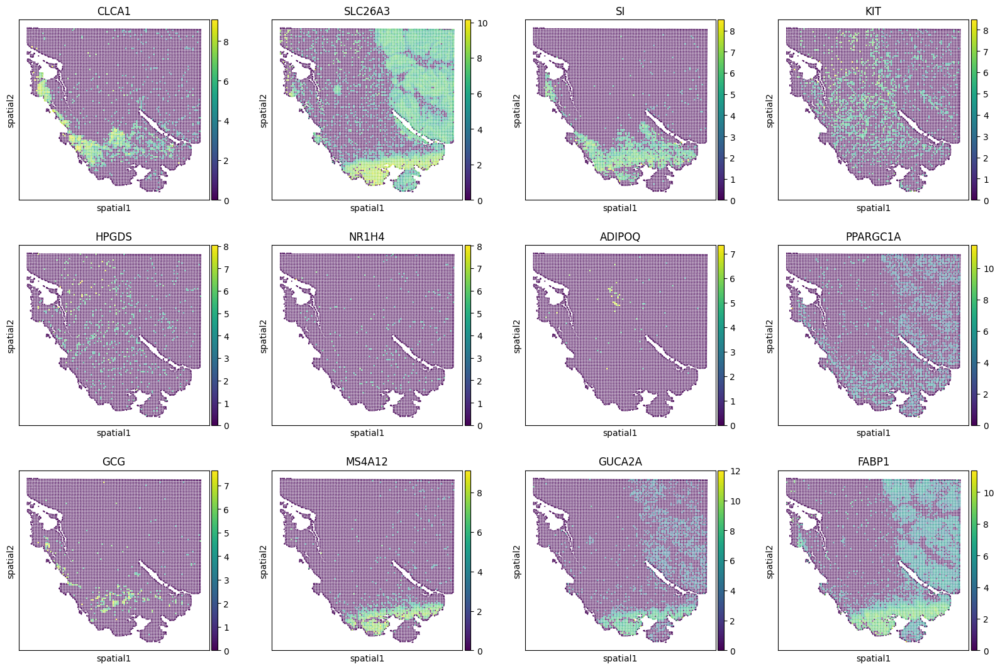

In [68]:
import scanpy as sc

# 유전자 리스트
genes = ["CLCA1", "SLC26A3", "SI", "KIT", "HPGDS", "NR1H4", 
         "ADIPOQ", "PPARGC1A", "GCG", "MS4A12", "GUCA2A", "FABP1"]

# adata_low에 존재하는 유전자만 필터링
genes_existing = [gene for gene in genes if gene in adata_low.var_names]

# spatial 위치 기준으로 유전자 발현 시각화
sc.pl.embedding(
    adata_low,
    basis="spatial",
    color=genes_existing,
    size=8,
    ncols=4  # 4개씩 나열
)


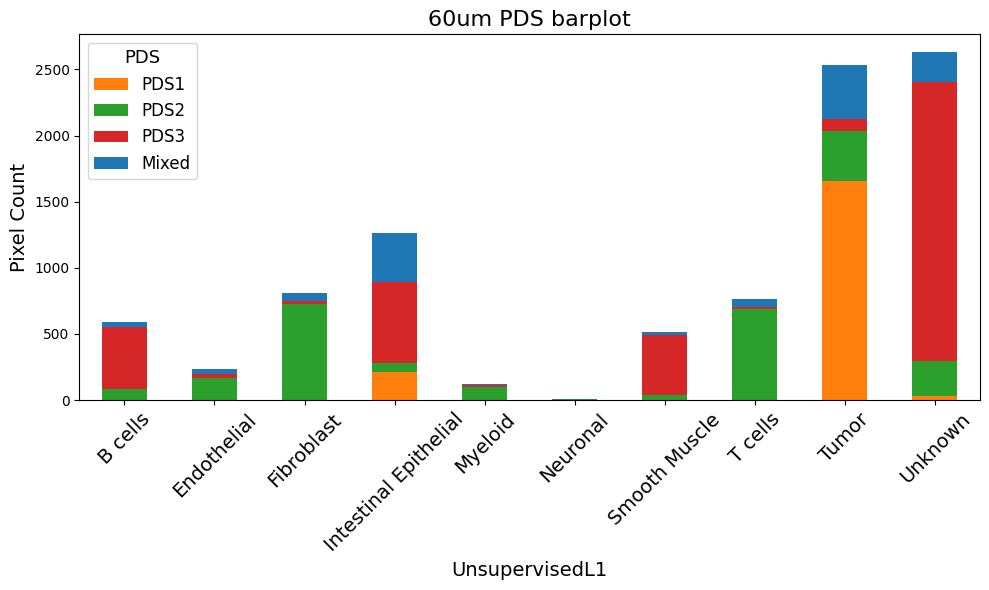

In [28]:
import pandas as pd
import matplotlib.pyplot as plt

# 1. PDS 순서 정렬 (PDS1 → PDS2 → PDS3 → Mixed 순서로 강제 정렬)
pds_order = ['PDS1', 'PDS2', 'PDS3', 'Mixed']
ct = pd.crosstab(adata_low.obs['UnsupervisedL1'], adata_low.obs['PDS'])[pds_order]

# 2. 색상 지정
colors = {
    'PDS1': '#ff7f0e',  # 주황
    'PDS2': '#2ca02c',  # 초록
    'PDS3': '#d62728',  # 빨강
    'Mixed': '#1f77b4'  # 파랑
}

# 3. Stacked barplot
ax = ct.plot(
    kind='bar',
    stacked=True,
    figsize=(10, 6),
    color=[colors[col] for col in ct.columns]
)

# 👉 x축 레이블 회전 + 폰트 크기 증가
plt.xticks(rotation=45, fontsize=14)

# 👉 y축, title 등 추가 꾸미기
plt.xlabel('UnsupervisedL1', fontsize=14)
plt.ylabel('Pixel Count', fontsize=14)
plt.title('60um PDS barplot', fontsize=16)
plt.legend(title='PDS', fontsize=12, title_fontsize=13)

plt.tight_layout()
plt.show()


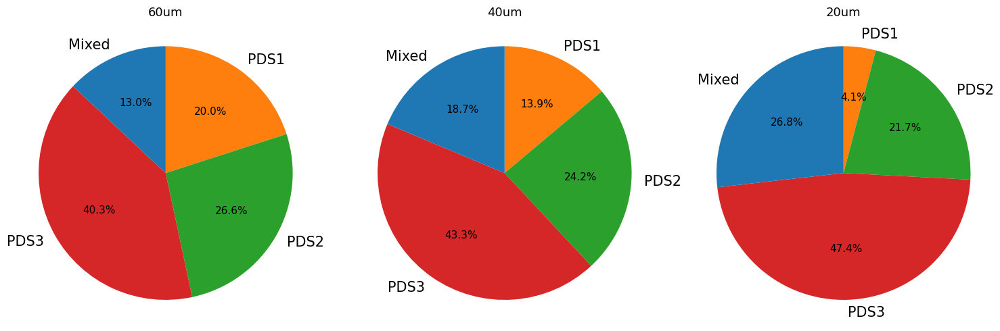

In [29]:
import matplotlib.pyplot as plt

# 1. 데이터 정의
group1 = {'PDS3': 3819, 'PDS2': 2519, 'PDS1': 1896, 'Mixed': 1231}
group2 = {'PDS3': 9070, 'PDS2': 5073, 'Mixed': 3917, 'PDS1': 2907}
group3 = {'PDS3': 38971, 'Mixed': 22047, 'PDS2': 17886, 'PDS1': 3370}

groups = [group1, group2, group3]
titles = ['60um', '40um', '20um']

# 👉 바뀐 색상 매핑
category_order = ['PDS1', 'PDS2', 'PDS3', 'Mixed']
colors = {
    'PDS1': '#ff7f0e',  # 주황
    'PDS2': '#2ca02c',  # 초록
    'PDS3': '#d62728',  # 빨강
    'Mixed': '#1f77b4'  # 파랑
}

# 2. Plotting
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

for i, (group, title) in enumerate(zip(groups, titles)):
    sizes = [group.get(cat, 0) for cat in category_order]
    labels = category_order
    color_list = [colors[cat] for cat in category_order]

    wedges, texts, autotexts = axs[i].pie(
        sizes,
        labels=labels,
        autopct='%1.1f%%',
        startangle=90,
        counterclock=False,
        colors=color_list
    )

    for text in texts:
        text.set_fontsize(15)
    for autotext in autotexts:
        autotext.set_fontsize(11)

    axs[i].axis('equal')
    axs[i].set_title(title, fontsize=13)

plt.tight_layout()
plt.show()


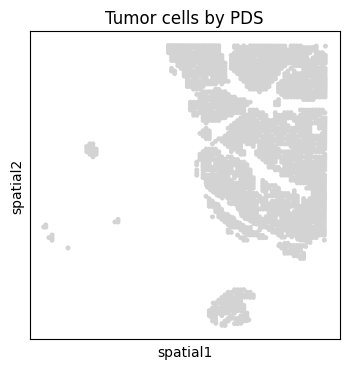

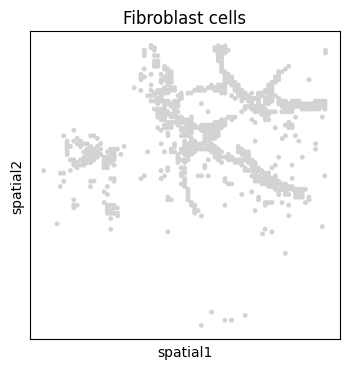

In [30]:
import scanpy as sc
import numpy as np

# 1. 조건 필터링
tumor_mask = adata_low.obs['UnsupervisedL1'] == 'Tumor'
fibro_mask = adata_low.obs['UnsupervisedL1'] == 'Fibroblast'

adata_tumor = adata_low[tumor_mask].copy()
adata_fibro = adata_low[fibro_mask].copy()

# 2. Tumor는 PDS별 색상 지정 (PDS컬럼에 맞춰 colors 딕셔너리로 매핑)
colors_dict = {
    'PDS1': '#ff7f0e',  # 주황
    'PDS2': '#2ca02c',  # 초록
    'PDS3': '#d62728',  # 빨강
    'Mixed': '#1f77b4'  # 파랑
}

# PDS별 색상 리스트 생성
tumor_colors = adata_tumor.obs['PDS'].map(colors_dict).tolist()

# 3. Fibroblast는 검은색
fibro_colors = ['black'] * adata_fibro.n_obs

# 4. Plot
# Tumor 먼저 plot (PDS별 색상)
sc.pl.embedding(
    adata_tumor,
    basis='spatial',
    color=None,
    size=50,
    show=False,
    title='Tumor cells by PDS',
    edgecolor='none',
    palette=tumor_colors  # palette 인자로 리스트 주는 경우 오류날 수 있음 (아래 참조)
)

# Fibroblast plot (검은색)
sc.pl.embedding(
    adata_fibro,
    basis='spatial',
    color=None,
    size=50,
    show=True,
    title='Fibroblast cells',
    edgecolor='none',
    palette=['black']
)


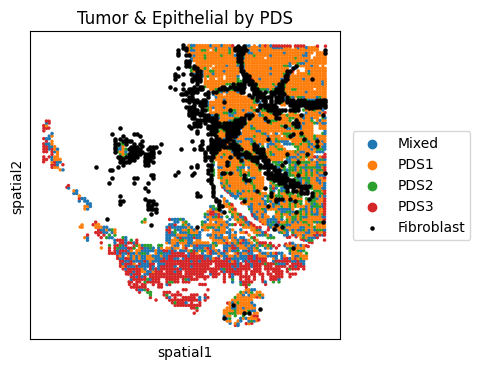

In [31]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np

# PDS 색상 정의
colors_dict = {
    'PDS1': '#ff7f0e',  # 주황
    'PDS2': '#2ca02c',  # 초록
    'PDS3': '#d62728',  # 빨강
    'Mixed': '#1f77b4'  # 파랑
}

# Tumor + Intestinal Epithelial 셀 필터링
adata_pds = adata_low[
    adata_low.obs['UnsupervisedL1'].isin(['Tumor', 'Intestinal Epithelial'])
].copy()

# Fibroblast 셀 필터링
adata_fibro = adata_low[adata_low.obs['UnsupervisedL1'] == 'Fibroblast'].copy()

# PDS 색상으로 spatial plot
sc.pl.embedding(
    adata_pds,
    basis='spatial',
    color='PDS',
    palette=colors_dict,
    size=25,
    show=False,
    title='Tumor & Epithelial by PDS'
)

# Fibroblast 검정색 덧그리기
plt.scatter(
    adata_fibro.obsm['spatial'][:, 0],
    adata_fibro.obsm['spatial'][:, 1],
    color='black',
    s=5,
    label='Fibroblast'
)

# 범례 오른쪽 바깥에 추가
plt.legend(loc='center left', bbox_to_anchor=(1.02, 0.5))
plt.show()


# SMI score

In [32]:
import pandas as pd

# 파일 경로
file_path = "/home/Data_Drive_8TB/kykim/2. CRC/CRC2/PDSclassifier/ST_GSM8594567_P1CRC_60um_SMI.parquet"

# parquet 파일 읽기
df = pd.read_parquet(file_path)

In [33]:
# 1. df["Gene"]를 인덱스로 설정 (Gene 이름이 index가 되도록)
df = df.set_index("Gene")

# 2. adata_low.obs의 인덱스와 df 인덱스를 기준으로 align
#    (겹치는 인덱스에 대해서만 값이 들어갑니다)
adata_low.obs["SMI"] = df["SMI"].reindex(adata_low.obs.index)

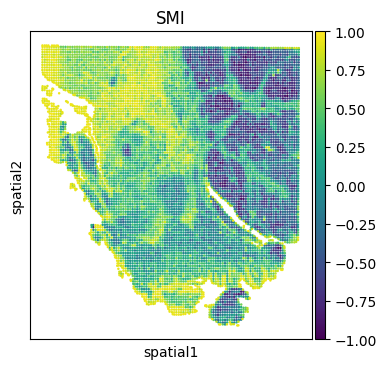

In [34]:
sc.pl.embedding(adata_low, basis="spatial", color="SMI")

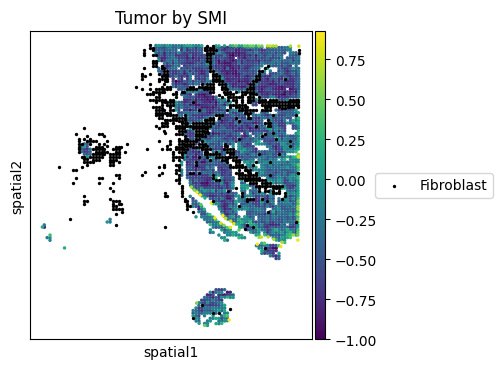

In [35]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np

colors_dict = {
    'PDS1': '#ff7f0e',  # 주황
    'PDS2': '#2ca02c',  # 초록
    'PDS3': '#d62728',  # 빨강
    'Mixed': '#1f77b4'  # 파랑
}

# 1. Tumor 셀만 필터링
adata_tumor = adata_low[adata_low.obs['UnsupervisedL1'] == 'Tumor'].copy()

# 2. Fibroblast 셀 필터링
adata_fibro = adata_low[adata_low.obs['UnsupervisedL1'] == 'Fibroblast'].copy()

# 3. Tumor PDS별 색상으로 그리기
sc.pl.embedding(
    adata_tumor,
    basis='spatial',
    color='SMI',
    palette=colors_dict,
    size=25,
    show=False,
    title='Tumor by SMI'
)

# 4. Fibroblast 검은색으로 덧그리기
plt.scatter(
    adata_fibro.obsm['spatial'][:, 0],
    adata_fibro.obsm['spatial'][:, 1],
    color='black',
    s=2,
    label='Fibroblast'
)

# 5. 범례를 그래프 오른쪽 밖으로
plt.legend(loc='center left', bbox_to_anchor=(1.2, 0.5))

plt.show()


# Inflammotory / Immunosuppressive score (Smoothing)

In [32]:
# 매핑 딕셔너리 (원본명: 표준명)
mapping = {
    "Adenosine": "NT5E",
    "CD39": "ENTPD1",
    "CD73": "NT5E",
    "CTLA-4": "CTLA4",
    "HIF-1α": "HIF1A",
    "IL-10": "IL10",
    "IL-17A": "IL17A",
    "IL-1β": "IL1B",
    "IL-8": "CXCL8",
    "LAG-3": "LAG3",
    "PD-L1": "CD274",
    "PD-L2": "PDCD1LG2",
    "TGF-β": "TGFB1",
    "TIM-3": "HAVCR2",
    "VEGF": "VEGFA",
    "β2M": "B2M",
    # Inflammatory
    "C1q": ["C1QA", "C1QB", "C1QC"],
    "C5a": "C5",
    "IFN‑γ": "IFNG",
    "IL‑12A": "IL12A",
    "IL‑12B": "IL12B",
    "IL‑15": "IL15",
    "IL‑17F": "IL17F",
    "IL‑2": "IL2",
    "IL‑23A": "IL23A",
    "IL‑33": "IL33",
    "IL‑6": "IL6",
    "TNF‑α": "TNF",
}

# adata genes set
adata_genes = set(adata_low.var_names)

def check_genes(gene_list):
    not_found = []
    for g in gene_list:
        std = mapping.get(g, g)  # 매핑 없으면 원래 이름 그대로
        if isinstance(std, list):
            # 리스트면 하나라도 있으면 OK
            if not any(x in adata_genes for x in std):
                not_found.append(g)
        else:
            if std not in adata_genes:
                not_found.append(g)
    return not_found

immunosuppressive_genes = [
    "IL-10", "TGF-β", "CCL17", "CCL18", "CCL22", "MMP9", "VEGF", "HGF", "ROS", "NO",
    "ARG1", "CD39", "CD73", "Adenosine", "PD-L1", "PD-L2", "CTLA-4", "TIM-3", "LAG-3",
    "TIGIT", "CXCL3", "IL-1β", "IL-8", "IL-17A", "Lactate", "HIF-1α", "β2M"
]

inflammatory_genes = [
    "IFN‑γ", "TNF‑α", "IL‑2", "IL‑12A", "IL‑12B", "IL‑6", "IL‑23A", "IL‑1β", "IL‑17A",
    "IL‑17F", "IL‑33", "CXCL9", "CXCL10", "CXCL11", "CXCL5", "CCL5", "CSF2", "IL‑15",
    "TLR4", "TREM1", "TIMP1", "NLRC4", "C5a", "C1q"
]

immuno_not_found = check_genes(immunosuppressive_genes)
inflam_not_found = check_genes(inflammatory_genes)

print("❌ Immunosuppressive genes NOT found (mapped):")
print(immuno_not_found)
print("\n❌ Inflammatory genes NOT found (mapped):")
print(inflam_not_found)



❌ Immunosuppressive genes NOT found (mapped):
['ROS', 'NO', 'Lactate']

❌ Inflammatory genes NOT found (mapped):
['IL‑1β', 'IL‑17A']


In [33]:
import unicodedata

# 유전자 정규화 함수 (하이픈, 그리스 문자 포함)
def normalize_gene_name(gene):
    return unicodedata.normalize("NFKC", gene).replace("‑", "-").replace("β", "B").replace("α", "A").replace("γ", "G")

# 정규화된 adata gene set
normalized_adata_genes = set(normalize_gene_name(g) for g in adata_low.var_names)

# 주어진 매핑
mapping = {
    "Adenosine": "NT5E",
    "CD39": "ENTPD1",
    "CD73": "NT5E",
    "CTLA-4": "CTLA4",
    "HIF-1α": "HIF1A",
    "IL-10": "IL10",
    "IL-17A": "IL17A",
    "IL-1β": "IL1B",
    "IL-8": "CXCL8",
    "LAG-3": "LAG3",
    "PD-L1": "CD274",
    "PD-L2": "PDCD1LG2",
    "TGF-β": "TGFB1",
    "TIM-3": "HAVCR2",
    "VEGF": "VEGFA",
    "β2M": "B2M",
    # Inflammatory
    "C1q": ["C1QA", "C1QB", "C1QC"],
    "C5a": "C5",
    "IFN‑γ": "IFNG",
    "IL‑12A": "IL12A",
    "IL‑12B": "IL12B",
    "IL‑15": "IL15",
    "IL‑17F": "IL17F",
    "IL‑2": "IL2",
    "IL‑23A": "IL23A",
    "IL‑33": "IL33",
    "IL‑6": "IL6",
    "TNF‑α": "TNF",
}

# 분류 정의
immuno_keys = {
    "Adenosine", "CD39", "CD73", "CTLA-4", "HIF-1α", "IL-10", "IL-17A", "IL-1β",
    "IL-8", "LAG-3", "PD-L1", "PD-L2", "TGF-β", "TIM-3", "VEGF", "β2M"
}

inflamm_keys = {
    "C1q", "C5a", "IFN‑γ", "IL‑12A", "IL‑12B", "IL‑15", "IL‑17F", "IL‑2",
    "IL‑23A", "IL‑33", "IL‑6", "TNF‑α"
}

# 결과 리스트
immuno_found = []
inflamm_found = []

for original, mapped in mapping.items():
    # normalize mapped gene(s)
    if isinstance(mapped, list):
        found = any(normalize_gene_name(g) in normalized_adata_genes for g in mapped)
    else:
        found = normalize_gene_name(mapped) in normalized_adata_genes

    if found:
        if original in immuno_keys:
            immuno_found.append((original, mapped))
        elif original in inflamm_keys:
            inflamm_found.append((original, mapped))

# 출력
print("✅ Found Immunosuppressive Genes:")
for orig, val in immuno_found:
    print(f"{orig} → {val}")

print("\n🔥 Found Inflammatory Genes:")
for orig, val in inflamm_found:
    print(f"{orig} → {val}")


###############

# 🔽 항원제시 관련 유전자 매핑 정의
antigen_presentation_genes = {
    "HLA-A": "HLA-A",
    "HLA-B": "HLA-B",
    "B2M": "B2M",  # 이미 mapping에도 있었음
    "TAP1": "TAP1",
    "TAP2": "TAP2",
    "PSMB8": "PSMB8",  # LMP7
    "PSMB9": "PSMB9",  # LMP2
    "HLA-DRA": "HLA-DRA",
    "CIITA": "CIITA",
    "NLRC5": "NLRC5",
    "IRF1": "IRF1",
    "STAT1": "STAT1"
}

# 🔍 결과 저장용 리스트
antigen_presentation_found = []

# ✅ 정규화 후 존재 여부 확인
for original, mapped in antigen_presentation_genes.items():
    if isinstance(mapped, list):
        found = any(normalize_gene_name(g) in normalized_adata_genes for g in mapped)
    else:
        found = normalize_gene_name(mapped) in normalized_adata_genes

    if found:
        antigen_presentation_found.append((original, mapped))

# ✅ 결과 출력
print("\n🧬 Found Antigen Presentation Genes:")
for orig, val in antigen_presentation_found:
    print(f"{orig} → {val}")


✅ Found Immunosuppressive Genes:
Adenosine → NT5E
CD39 → ENTPD1
CD73 → NT5E
CTLA-4 → CTLA4
HIF-1α → HIF1A
IL-10 → IL10
IL-17A → IL17A
IL-1β → IL1B
IL-8 → CXCL8
LAG-3 → LAG3
PD-L1 → CD274
PD-L2 → PDCD1LG2
TGF-β → TGFB1
TIM-3 → HAVCR2
VEGF → VEGFA
β2M → B2M

🔥 Found Inflammatory Genes:
C1q → ['C1QA', 'C1QB', 'C1QC']
C5a → C5
IFN‑γ → IFNG
IL‑12A → IL12A
IL‑12B → IL12B
IL‑15 → IL15
IL‑17F → IL17F
IL‑2 → IL2
IL‑23A → IL23A
IL‑33 → IL33
IL‑6 → IL6
TNF‑α → TNF

🧬 Found Antigen Presentation Genes:
B2M → B2M
TAP1 → TAP1
TAP2 → TAP2
PSMB8 → PSMB8
PSMB9 → PSMB9
CIITA → CIITA
NLRC5 → NLRC5
IRF1 → IRF1
STAT1 → STAT1


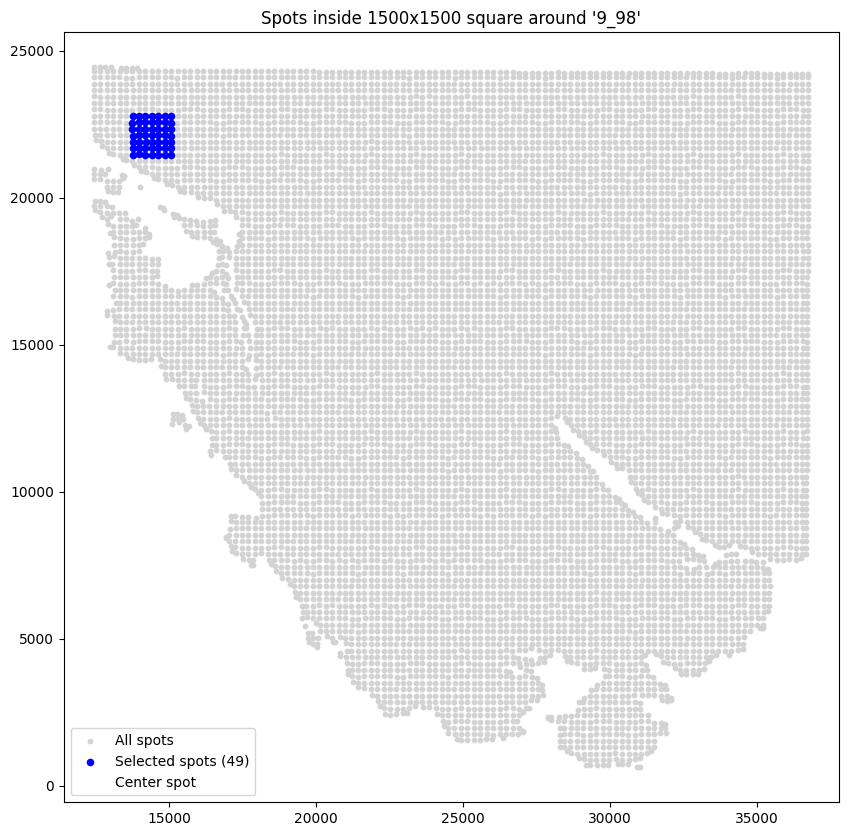

In [34]:
import matplotlib.pyplot as plt

def plot_points_in_square(adata, center_index, window_size):
    """
    Parameters:
    - adata: AnnData 객체
    - center_index: adata.obs_names의 인덱스 (string)
    - window_size: 정사각형 한 변의 길이 (float, 동일 단위)
    """
    spatial = adata.obsm["spatial"]
    if center_index not in adata.obs_names:
        raise ValueError(f"Index '{center_index}' not found in adata.obs_names")
    
    i = adata.obs_names.get_loc(center_index)
    center_coord = spatial[i]
    
    half = window_size / 2
    xmin, xmax = center_coord[0] - half, center_coord[0] + half
    ymin, ymax = center_coord[1] - half, center_coord[1] + half
    
    # 조건에 맞는 점들 필터링
    mask = (spatial[:,0] >= xmin) & (spatial[:,0] <= xmax) & (spatial[:,1] >= ymin) & (spatial[:,1] <= ymax)
    selected_coords = spatial[mask]
    selected_indices = adata.obs_names[mask]
    
    # 플롯
    plt.figure(figsize=(10,10))
    plt.scatter(spatial[:,0], spatial[:,1], c='lightgray', s=10, label='All spots')
    plt.scatter(selected_coords[:,0], selected_coords[:,1], c='blue', s=20, label=f'Selected spots ({len(selected_coords)})')
    plt.scatter(center_coord[0], center_coord[1], c='red', s=0, label='Center spot')
    plt.title(f"Spots inside {window_size}x{window_size} square around '{center_index}'")
    plt.legend()
    plt.axis('equal')
    plt.show()

# 사용 예시 (예: 2000 단위 정사각형)
plot_points_in_square(adata_low, center_index='9_98', window_size=1500)


In [35]:
import numpy as np
import pandas as pd

# ✅ 유전자 리스트
immuno_genes = [
    "NT5E", "ENTPD1", "CTLA4", "HIF1A", "IL10", "IL17A", "IL1B", "CXCL8", "LAG3",
    "CD274", "PDCD1LG2", "TGFB1", "HAVCR2", "VEGFA", "B2M"
]
inflam_genes = [
    "C1QA", "C1QB", "C1QC", "C5", "IFNG", "IL12A", "IL12B", "IL15", "IL17F", "IL2",
    "IL23A", "IL33", "IL6", "TNF"
]
antipres_genes = [
    "B2M", "TAP1", "TAP2", "PSMB8", "PSMB9","NLRC5", "IRF1", "STAT1"
]

# ✅ 인덱스 매핑
def get_gene_indices(adata, gene_list):
    gene_set = set(gene_list)
    return [i for i, g in enumerate(adata.var_names) if g in gene_set]

immuno_idx = get_gene_indices(adata_low, immuno_genes)
inflam_idx = get_gene_indices(adata_low, inflam_genes)
antipres_idx = get_gene_indices(adata_low, antipres_genes)

# ✅ 평균 계산 함수
def calc_gene_score_mean(adata, spot_idx, gene_idx):
    if len(spot_idx) == 0 or len(gene_idx) == 0:
        return np.nan
    submatrix = adata.X[spot_idx, :][:, gene_idx]
    if hasattr(submatrix, "toarray"):
        submatrix = submatrix.toarray()
    return np.mean(submatrix)

# ✅ 영역 내 spot 찾기
def get_spots_in_square(spatial, center_coord, window_size):
    half = window_size / 2
    xmin, xmax = center_coord[0] - half, center_coord[0] + half
    ymin, ymax = center_coord[1] - half, center_coord[1] + half
    mask = (spatial[:,0] >= xmin) & (spatial[:,0] <= xmax) & (spatial[:,1] >= ymin) & (spatial[:,1] <= ymax)
    return np.where(mask)[0]

# ✅ 전처리
spatial = adata_low.obsm["spatial"]
obs_names = adata_low.obs_names

results = {
    "1layer_supp": [],
    "1layer_inflam": [],
    "1layer_antipres": [],
    "2layer_supp": [],
    "2layer_inflam": [],
    "2layer_antipres": [],
    "3layer_supp": [],
    "3layer_inflam": [],
    "3layer_antipres": []
}

for idx, spot_id in enumerate(obs_names):
    center = spatial[idx]
    
    spots_1000 = set(get_spots_in_square(spatial, center, 500))
    spots_2000 = set(get_spots_in_square(spatial, center, 1000))
    spots_3000 = set(get_spots_in_square(spatial, center, 1500))
    
    layer1_spots = spots_1000
    layer2_spots = spots_2000 - spots_1000
    layer3_spots = spots_3000 - spots_2000

    # 1-layer
    results["1layer_supp"].append(calc_gene_score_mean(adata_low, list(layer1_spots), immuno_idx))
    results["1layer_inflam"].append(calc_gene_score_mean(adata_low, list(layer1_spots), inflam_idx))
    results["1layer_antipres"].append(calc_gene_score_mean(adata_low, list(layer1_spots), antipres_idx))

    # 2-layer
    results["2layer_supp"].append(calc_gene_score_mean(adata_low, list(layer2_spots), immuno_idx))
    results["2layer_inflam"].append(calc_gene_score_mean(adata_low, list(layer2_spots), inflam_idx))
    results["2layer_antipres"].append(calc_gene_score_mean(adata_low, list(layer2_spots), antipres_idx))

    # 3-layer
    results["3layer_supp"].append(calc_gene_score_mean(adata_low, list(layer3_spots), immuno_idx))
    results["3layer_inflam"].append(calc_gene_score_mean(adata_low, list(layer3_spots), inflam_idx))
    results["3layer_antipres"].append(calc_gene_score_mean(adata_low, list(layer3_spots), antipres_idx))

# ✅ 결과 obs에 저장
for col, vals in results.items():
    adata_low.obs[col] = vals

# ✅ 각 layer의 spot 개수도 추가
adata_low.obs["1layer_spot"] = [len(get_spots_in_square(spatial, spatial[i], 500)) for i in range(len(spatial))]
adata_low.obs["2layer_spot"] = [
    len(set(get_spots_in_square(spatial, spatial[i], 1000)) - set(get_spots_in_square(spatial, spatial[i], 500))) 
    for i in range(len(spatial))
]
adata_low.obs["3layer_spot"] = [
    len(set(get_spots_in_square(spatial, spatial[i], 1500)) - set(get_spots_in_square(spatial, spatial[i], 1000))) 
    for i in range(len(spatial))
]


In [36]:
# 안전한 나눗셈을 위해 np.where 사용 (0으로 나누는 것 방지)
one = adata_low.obs["1layer_spot"]
two = adata_low.obs["2layer_spot"]
three = adata_low.obs["3layer_spot"]

# 가중치 계산
weight_2 = np.where(two > 0, (one / two) * 0.5, 0)
weight_3 = np.where(three > 0, (one / three) * (1/3), 0)

# inflam_score 계산
adata_low.obs["inflam_score"] = (
    adata_low.obs["1layer_inflam"]
    + adata_low.obs["2layer_inflam"] * weight_2
    + adata_low.obs["3layer_inflam"] * weight_3
)

# supp_score 계산
adata_low.obs["supp_score"] = (
    adata_low.obs["1layer_supp"]
    + adata_low.obs["2layer_supp"] * weight_2
    + adata_low.obs["3layer_supp"] * weight_3
)


# supp_score 계산
adata_low.obs["antipres_score"] = (
    adata_low.obs["1layer_antipres"]
    + adata_low.obs["2layer_antipres"] * weight_2
    + adata_low.obs["3layer_antipres"] * weight_3
)

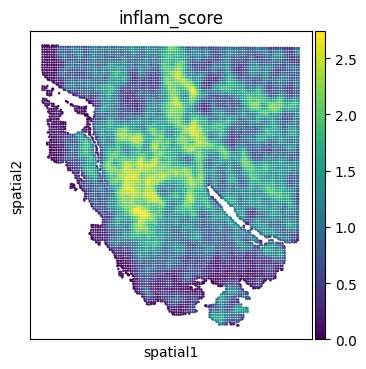

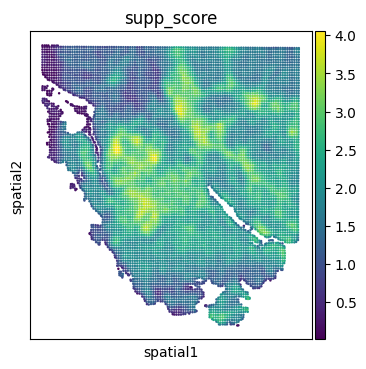

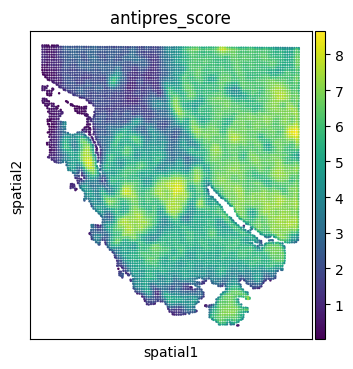

In [37]:
sc.pl.embedding(adata_low, basis="spatial", color="inflam_score")
sc.pl.embedding(adata_low, basis="spatial", color="supp_score")
sc.pl.embedding(adata_low, basis="spatial", color="antipres_score")

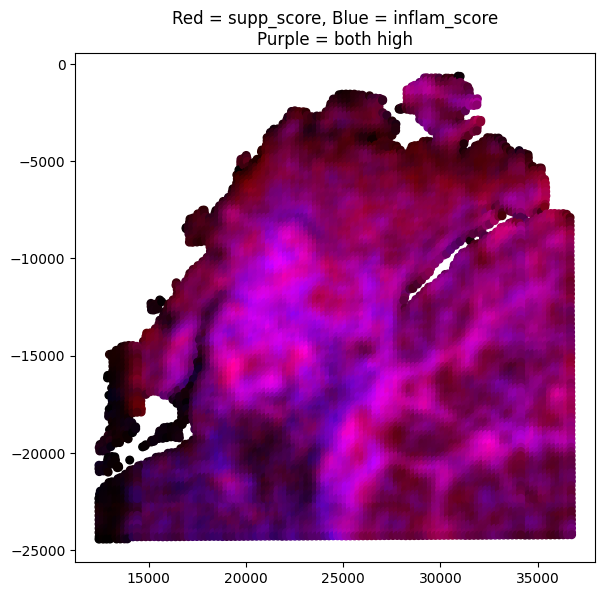

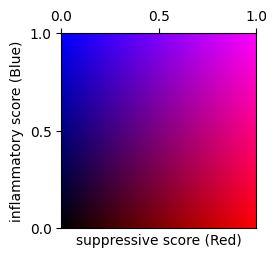

In [38]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import minmax_scale
from matplotlib.patches import Patch
from matplotlib.colors import Normalize

# 1. 점수 가져오기 (NaN → 0 처리)
inflam_raw = adata_low.obs["inflam_score"].fillna(0).values
supp_raw = adata_low.obs["supp_score"].fillna(0).values

# 2. 정규화 함수
def safe_minmax(arr):
    if np.all(arr == arr[0]):
        return np.zeros_like(arr)
    return minmax_scale(arr)

# 3. 정규화된 점수 (0~1 사이)
x = safe_minmax(inflam_raw)  # inflam → blue
y = safe_minmax(supp_raw)    # supp → red

# 4. RGB 색상 생성
r = y
g = np.zeros_like(x)
b = x
rgb = np.clip(np.stack([r, g, b], axis=1), 0, 1)

# 5. 좌표 (Y축 반전)
spatial = adata_low.obsm["spatial"].copy()
spatial[:, 1] = -spatial[:, 1]

# 6. 플롯 본체 + 색상
fig = plt.figure(figsize=(8, 8))
main_ax = fig.add_axes([0.1, 0.1, 0.65, 0.65])  # left, bottom, width, height

main_ax.scatter(spatial[:, 0], spatial[:, 1], c=rgb, s=30)
main_ax.set_title("Red = supp_score, Blue = inflam_score\nPurple = both high")
main_ax.set_aspect('equal')
plt.show()

####################################################
####################################################
####################################################


fig = plt.figure(figsize=(3, 3))  # 원하는 크기 조정 가능

# 하나의 axes (전체 figure를 사용)
cb_ax = fig.add_axes([0.2, 0.2, 0.65, 0.65])  # 내부 위치 조정

# RGB 그리드 구성
res = 100
r_vals = np.linspace(0, 1, res)
b_vals = np.linspace(0, 1, res)
R, B = np.meshgrid(r_vals, b_vals)
G = np.zeros_like(R)
color_grid = np.stack([R, G, B], axis=2)

# 이미지 출력
cb_ax.imshow(color_grid, origin='lower', extent=[0, 1, 0, 1], aspect='auto')

# 라벨 및 제목 설정
cb_ax.set_xlabel("suppressive score (Red)", fontsize=10)
cb_ax.set_ylabel("inflammatory score (Blue)", fontsize=10)

cb_ax.xaxis.set_label_position('bottom')
cb_ax.xaxis.tick_top()
cb_ax.set_xticks([0, 0.5, 1])
cb_ax.set_yticks([0, 0.5, 1])

plt.show()


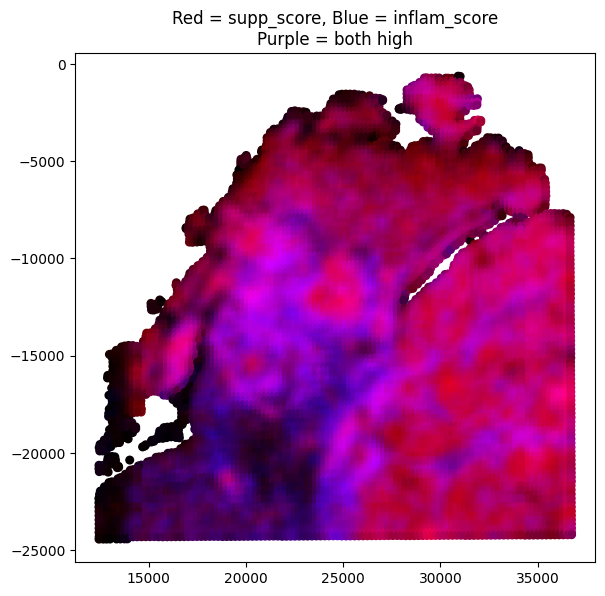

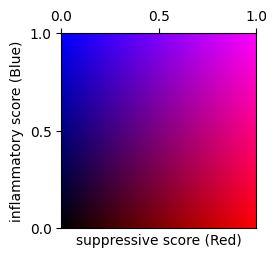

In [39]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import minmax_scale
from matplotlib.patches import Patch
from matplotlib.colors import Normalize

# 1. 점수 가져오기 (NaN → 0 처리)
inflam_raw = adata_low.obs["inflam_score"].fillna(0).values
supp_raw = adata_low.obs["antipres_score"].fillna(0).values

# 2. 정규화 함수
def safe_minmax(arr):
    if np.all(arr == arr[0]):
        return np.zeros_like(arr)
    return minmax_scale(arr)

# 3. 정규화된 점수 (0~1 사이)
x = safe_minmax(inflam_raw)  # inflam → blue
y = safe_minmax(supp_raw)    # supp → red

# 4. RGB 색상 생성
r = y
g = np.zeros_like(x)
b = x
rgb = np.clip(np.stack([r, g, b], axis=1), 0, 1)

# 5. 좌표 (Y축 반전)
spatial = adata_low.obsm["spatial"].copy()
spatial[:, 1] = -spatial[:, 1]

# 6. 플롯 본체 + 색상
fig = plt.figure(figsize=(8, 8))
main_ax = fig.add_axes([0.1, 0.1, 0.65, 0.65])  # left, bottom, width, height

main_ax.scatter(spatial[:, 0], spatial[:, 1], c=rgb, s=30)
main_ax.set_title("Red = supp_score, Blue = inflam_score\nPurple = both high")
main_ax.set_aspect('equal')
plt.show()

####################################################
####################################################
####################################################


fig = plt.figure(figsize=(3, 3))  # 원하는 크기 조정 가능

# 하나의 axes (전체 figure를 사용)
cb_ax = fig.add_axes([0.2, 0.2, 0.65, 0.65])  # 내부 위치 조정

# RGB 그리드 구성
res = 100
r_vals = np.linspace(0, 1, res)
b_vals = np.linspace(0, 1, res)
R, B = np.meshgrid(r_vals, b_vals)
G = np.zeros_like(R)
color_grid = np.stack([R, G, B], axis=2)

# 이미지 출력
cb_ax.imshow(color_grid, origin='lower', extent=[0, 1, 0, 1], aspect='auto')

# 라벨 및 제목 설정
cb_ax.set_xlabel("suppressive score (Red)", fontsize=10)
cb_ax.set_ylabel("inflammatory score (Blue)", fontsize=10)

cb_ax.xaxis.set_label_position('bottom')
cb_ax.xaxis.tick_top()
cb_ax.set_xticks([0, 0.5, 1])
cb_ax.set_yticks([0, 0.5, 1])

plt.show()

In [40]:
##########Correlation (Percentage)

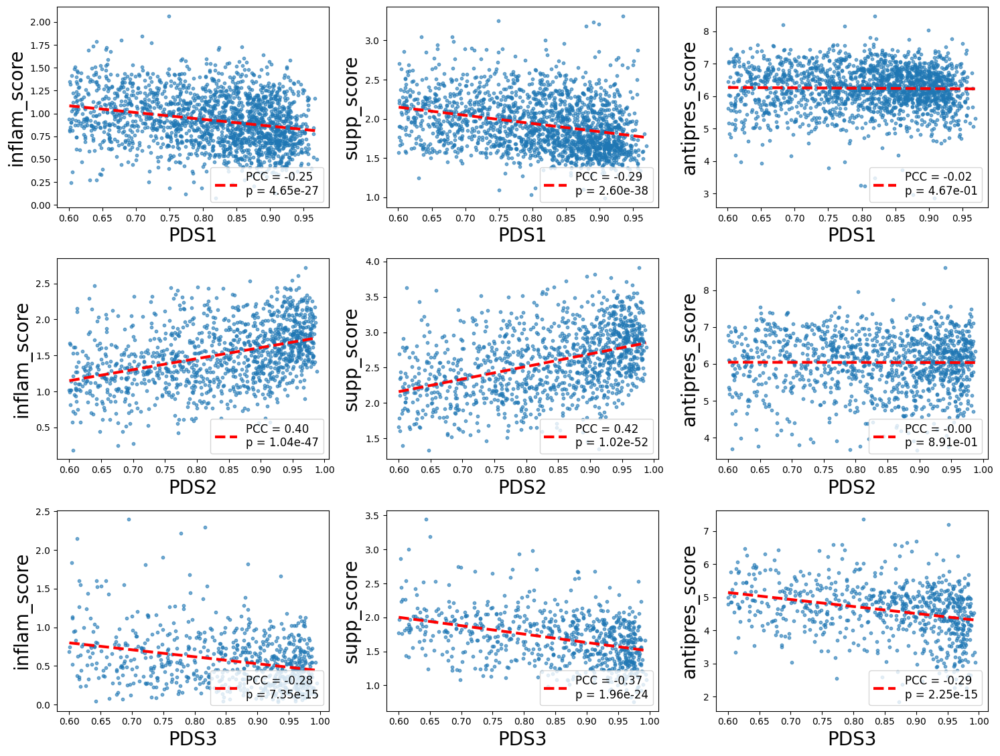

In [41]:
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
import numpy as np

# 조건 필터링: 특정 UnsupervisedL1만 선택
target_celltypes = ['Fibroblast', 'Tumor', 'Intestinal Epithelial']
adata_filtered = adata_low[adata_low.obs['UnsupervisedL1'].isin(target_celltypes)]

# 컬럼 이름 매핑
score_cols = ['inflam_score', 'supp_score', 'antipres_score']
pds_list = ['PDS1', 'PDS2', 'PDS3']

# 그림 설정
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 12), sharex=False, sharey=False)

# 반복적으로 plot
for row_idx, pds in enumerate(pds_list):
    subset = adata_filtered.obs[adata_filtered.obs['PDS'] == pds]
    x_col = pds  # PDS1, PDS2, PDS3 값이 obs에 있어야 함

    for col_idx, y_col in enumerate(score_cols):
        ax = axes[row_idx, col_idx]

        x = subset[x_col].values
        y = subset[y_col].values

        # 상관계수 및 회귀선 계산
        if len(x) > 1 and len(y) > 1 and np.std(x) > 0 and np.std(y) > 0:
            corr, pval = pearsonr(x, y)

            # 회귀선 (1차 직선) 계산
            slope, intercept = np.polyfit(x, y, 1)
            x_fit = np.linspace(min(x), max(x), 100)
            y_fit = slope * x_fit + intercept

            # 추세선 추가 (빨간 점선)
            ax.plot(x_fit, y_fit, 'r--', linewidth=3)
        else:
            corr, pval = np.nan, np.nan

        # 산점도
        ax.scatter(x, y, alpha=0.6, s=10)

        # 축 라벨
        ax.set_xlabel(x_col, fontsize=20)
        ax.set_ylabel(y_col, fontsize=20)

        # 범례 (PCC, p-value)
        legend_text = f"PCC = {corr:.2f}\np = {pval:.2e}"
        ax.legend([legend_text], loc='lower right', fontsize=12)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


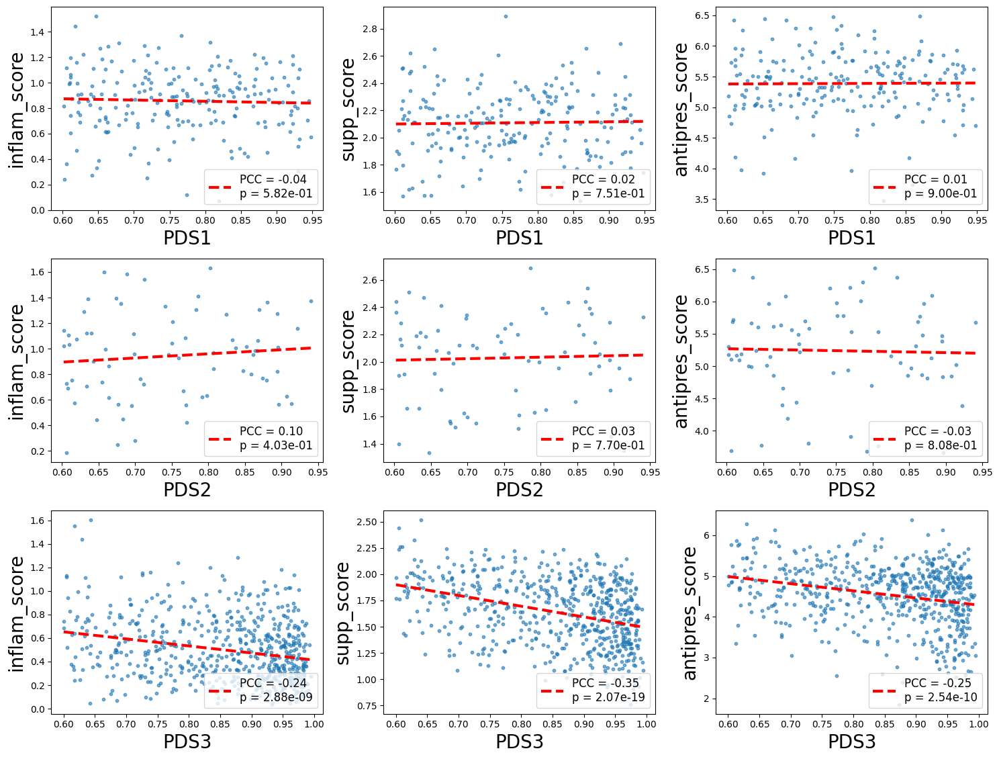

In [44]:
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
import numpy as np

# 조건 필터링: 특정 UnsupervisedL1만 선택
target_celltypes = ['Intestinal Epithelial']
adata_filtered = adata_low[adata_low.obs['UnsupervisedL1'].isin(target_celltypes)]

# 컬럼 이름 매핑
score_cols = ['inflam_score', 'supp_score', 'antipres_score']
pds_list = ['PDS1', 'PDS2', 'PDS3']

# 그림 설정
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 12), sharex=False, sharey=False)

# 반복적으로 plot
for row_idx, pds in enumerate(pds_list):
    subset = adata_filtered.obs[adata_filtered.obs['PDS'] == pds]
    x_col = pds  # PDS1, PDS2, PDS3 값이 obs에 있어야 함

    for col_idx, y_col in enumerate(score_cols):
        ax = axes[row_idx, col_idx]

        x = subset[x_col].values
        y = subset[y_col].values

        # 상관계수 및 회귀선 계산
        if len(x) > 1 and len(y) > 1 and np.std(x) > 0 and np.std(y) > 0:
            corr, pval = pearsonr(x, y)

            # 회귀선 (1차 직선) 계산
            slope, intercept = np.polyfit(x, y, 1)
            x_fit = np.linspace(min(x), max(x), 100)
            y_fit = slope * x_fit + intercept

            # 추세선 추가 (빨간 점선)
            ax.plot(x_fit, y_fit, 'r--', linewidth=3)
        else:
            corr, pval = np.nan, np.nan

        # 산점도
        ax.scatter(x, y, alpha=0.6, s=10)

        # 축 라벨
        ax.set_xlabel(x_col, fontsize=20)
        ax.set_ylabel(y_col, fontsize=20)

        # 범례 (PCC, p-value)
        legend_text = f"PCC = {corr:.2f}\np = {pval:.2e}"
        ax.legend([legend_text], loc='lower right', fontsize=12)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


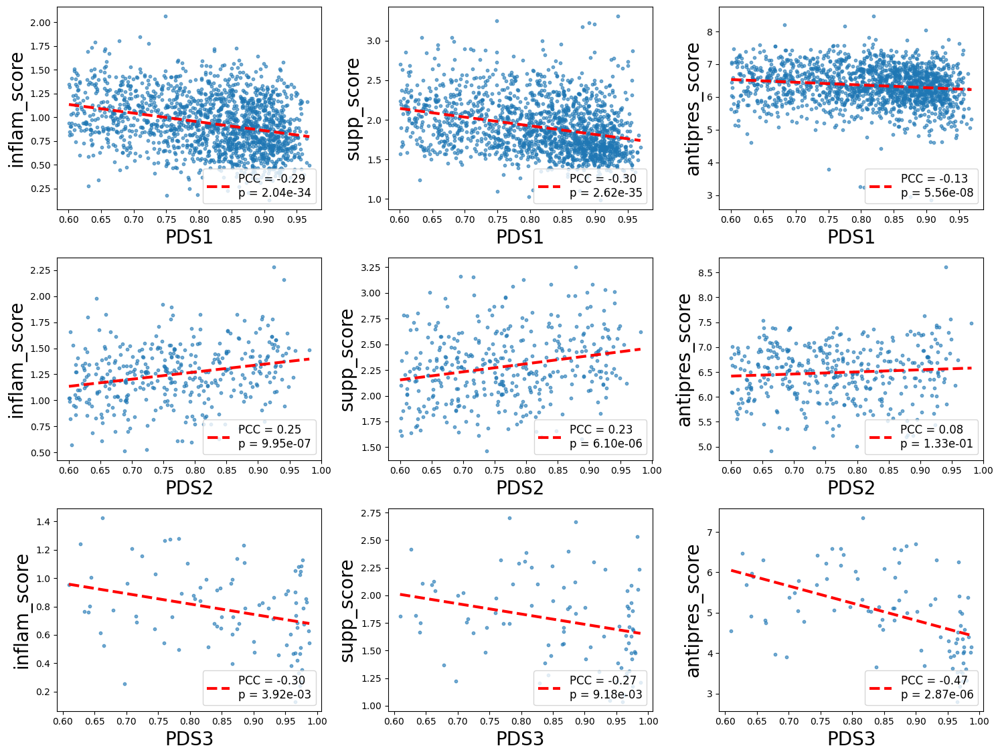

In [45]:
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
import numpy as np

# 조건 필터링: 특정 UnsupervisedL1만 선택
target_celltypes = ['Tumor']
adata_filtered = adata_low[adata_low.obs['UnsupervisedL1'].isin(target_celltypes)]

# 컬럼 이름 매핑
score_cols = ['inflam_score', 'supp_score', 'antipres_score']
pds_list = ['PDS1', 'PDS2', 'PDS3']

# 그림 설정
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 12), sharex=False, sharey=False)

# 반복적으로 plot
for row_idx, pds in enumerate(pds_list):
    subset = adata_filtered.obs[adata_filtered.obs['PDS'] == pds]
    x_col = pds  # PDS1, PDS2, PDS3 값이 obs에 있어야 함

    for col_idx, y_col in enumerate(score_cols):
        ax = axes[row_idx, col_idx]

        x = subset[x_col].values
        y = subset[y_col].values

        # 상관계수 및 회귀선 계산
        if len(x) > 1 and len(y) > 1 and np.std(x) > 0 and np.std(y) > 0:
            corr, pval = pearsonr(x, y)

            # 회귀선 (1차 직선) 계산
            slope, intercept = np.polyfit(x, y, 1)
            x_fit = np.linspace(min(x), max(x), 100)
            y_fit = slope * x_fit + intercept

            # 추세선 추가 (빨간 점선)
            ax.plot(x_fit, y_fit, 'r--', linewidth=3)
        else:
            corr, pval = np.nan, np.nan

        # 산점도
        ax.scatter(x, y, alpha=0.6, s=10)

        # 축 라벨
        ax.set_xlabel(x_col, fontsize=20)
        ax.set_ylabel(y_col, fontsize=20)

        # 범례 (PCC, p-value)
        legend_text = f"PCC = {corr:.2f}\np = {pval:.2e}"
        ax.legend([legend_text], loc='lower right', fontsize=12)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


In [66]:
#############가중치 최적화

In [85]:
import numpy as np
from scipy.stats import pearsonr

# 🔍 조건 필터링
filtered_df = adata_low.obs[
    (adata_low.obs["PDS"] == "PDS2") &
    (adata_low.obs["UnsupervisedL1"].isin(["Fibroblast", "Tumor", "Intestinal Epithelial"]))
]

# 변수 추출
x1 = filtered_df["1layer_inflam"].values
x2 = filtered_df["2layer_inflam"].values
x3 = filtered_df["3layer_inflam"].values
y = filtered_df["PDS2"].values

# 결과 저장용
best_pcc = -np.inf
best_w2, best_w3 = None, None

# 탐색 범위: w2 > w3 조건 하에서 0.0 ~ 1.0 by 0.001
w_range = np.arange(0.0, 1.00, 0.001)

for w2 in w_range:
    for w3 in w_range:
        if w2 <= w3:
            continue  # 조건 위반

        pred = x1 + x2 * w2 + x3 * w3
        if np.std(pred) == 0:
            continue

        pcc, _ = pearsonr(pred, y)
        if np.isnan(pcc):
            continue

        if abs(pcc) > best_pcc:
            best_pcc = abs(pcc)
            best_w2, best_w3 = w2, w3

print("✅ 최적 가중치 (inflam_score 기준, PDS2 상관 최댓값, 특정 셀타입만):")
print(f"  weight_2 = {best_w2:.3f}")
print(f"  weight_3 = {best_w3:.3f}")
print(f"  PCC = {best_pcc:.4f}")


✅ 최적 가중치 (inflam_score 기준, PDS2 상관 최댓값, 특정 셀타입만):
  weight_2 = 0.131
  weight_3 = 0.082
  PCC = 0.4072


In [86]:
import numpy as np
from scipy.stats import pearsonr

# 🔍 조건 필터링
filtered_df = adata_low.obs[
    (adata_low.obs["PDS"] == "PDS2") &
    (adata_low.obs["UnsupervisedL1"].isin(["Fibroblast", "Tumor", "Intestinal Epithelial"]))
]

# 변수 추출
x1 = filtered_df["1layer_supp"].values
x2 = filtered_df["2layer_supp"].values
x3 = filtered_df["3layer_supp"].values
y = filtered_df["PDS2"].values

# 결과 저장용
best_pcc = -np.inf
best_w2, best_w3 = None, None

# 탐색 범위: w2 > w3 조건 하에서 0.0 ~ 1.0 by 0.001
w_range = np.arange(0.0, 1.00, 0.001)

for w2 in w_range:
    for w3 in w_range:
        if w2 <= w3:
            continue  # 조건 위반

        pred = x1 + x2 * w2 + x3 * w3
        if np.std(pred) == 0:
            continue

        pcc, _ = pearsonr(pred, y)
        if np.isnan(pcc):
            continue

        if abs(pcc) > best_pcc:
            best_pcc = abs(pcc)
            best_w2, best_w3 = w2, w3

print("✅ 최적 가중치 (suppressive_score 기준, PDS2 상관 최댓값, 특정 셀타입만):")
print(f"  weight_2 = {best_w2:.3f}")
print(f"  weight_3 = {best_w3:.3f}")
print(f"  PCC = {best_pcc:.4f}")


✅ 최적 가중치 (suppressive_score 기준, PDS2 상관 최댓값, 특정 셀타입만):
  weight_2 = 0.096
  weight_3 = 0.000
  PCC = 0.4340


# Antigen presentation scoring

In [46]:
# ❌ 존재하지 않는 유전자 12개 (하드코딩으로 제외)
# ['HLA-A', 'HLA-B', 'HLA-C', 'HLA-E', 'HLA-F', 'HLA-G',
#  'HLA-DRA', 'HLA-DRB1', 'HLA-DQA1', 'HLA-DQB1', 'HLA-DPA1', 'HLA-DPB1']

# ✅ 제외 후 gene list
mhc_i_filtered = [
    'B2M', 'TAP1', 'TAP2', 'TAPBP', 'CALR', 'CANX', 'PDIA3',
    'PSMB8', 'PSMB9', 'PSMB10', 'PSME1', 'PSME2',
    'ERAP1', 'ERAP2', 'NLRC5', 'IRF1', 'STAT1'
]

mhc_ii_filtered = [
    'CD74', 'CTSS', 'CTSL', 'CTSA',
    'LGMN', 'RFX5', 'RFXAP', 'RFXANK', 'CIITA', 'IFNG'
]

costimulatory_genes = [
    'CD80', 'CD86', 'CD40', 'CD83', 'CD274', 'PDCD1LG2', 'CD276', 'VTCN1'
]

# 전체 gene list (❌ 제외된 것 없이 하드코딩으로 정리된 최종 버전)
all_genes_filtered = mhc_i_filtered + mhc_ii_filtered + costimulatory_genes

# var_names 대문자 정규화
var_names_upper = adata_low.var_names.str.upper()

# 존재 여부 확인
gene_check = {gene: gene.upper() in var_names_upper.tolist() for gene in all_genes_filtered}

# 결과 분리
present_genes = [gene for gene, present in gene_check.items() if present]
missing_genes = [gene for gene, present in gene_check.items() if not present]

# 출력
print("✅ 존재하는 유전자 (True):")
print(present_genes)

print("\n❌ 존재하지 않는 유전자 (False):")
print(missing_genes)


✅ 존재하는 유전자 (True):
['B2M', 'TAP1', 'TAP2', 'TAPBP', 'CALR', 'CANX', 'PDIA3', 'PSMB8', 'PSMB9', 'PSMB10', 'PSME1', 'PSME2', 'ERAP1', 'ERAP2', 'NLRC5', 'IRF1', 'STAT1', 'CD74', 'CTSS', 'CTSL', 'CTSA', 'LGMN', 'RFX5', 'RFXAP', 'RFXANK', 'CIITA', 'IFNG', 'CD80', 'CD86', 'CD40', 'CD83', 'CD274', 'PDCD1LG2', 'CD276', 'VTCN1']

❌ 존재하지 않는 유전자 (False):
[]


In [47]:
import numpy as np
import pandas as pd

# ✅ 유전자 리스트
mhc_i_genes = [
    'B2M', 'TAP1', 'TAP2', 'TAPBP', 'CALR', 'CANX', 'PDIA3',
    'PSMB8', 'PSMB9', 'PSMB10', 'PSME1', 'PSME2',
    'ERAP1', 'ERAP2', 'NLRC5', 'IRF1', 'STAT1'
]

mhc_ii_genes = [
    'CD74', 'CTSS', 'CTSL', 'CTSA',
    'LGMN', 'RFX5', 'RFXAP', 'RFXANK', 'CIITA', 'IFNG'
]

costimulatory_genes = [
    'CD80', 'CD86', 'CD40', 'CD83', 'CD274', 'PDCD1LG2', 'CD276', 'VTCN1'
]

def get_gene_indices(adata, gene_list):
    gene_set = set(gene_list)
    return [i for i, g in enumerate(adata.var_names) if g in gene_set]

mhc_i_idx = get_gene_indices(adata_low, mhc_i_genes)
mhc_ii_idx = get_gene_indices(adata_low, mhc_ii_genes)
antipres_idx = get_gene_indices(adata_low, costimulatory_genes)

# 평균 계산 함수
def calc_gene_score_mean(adata, spot_idx, gene_idx):
    if len(spot_idx) == 0 or len(gene_idx) == 0:
        return np.nan
    submatrix = adata.X[spot_idx, :][:, gene_idx]
    if hasattr(submatrix, "toarray"):
        submatrix = submatrix.toarray()
    return np.mean(submatrix)

# 영역 내 spot 찾기
def get_spots_in_square(spatial, center_coord, window_size):
    half = window_size / 2
    xmin, xmax = center_coord[0] - half, center_coord[0] + half
    ymin, ymax = center_coord[1] - half, center_coord[1] + half
    mask = (spatial[:, 0] >= xmin) & (spatial[:, 0] <= xmax) & (spatial[:, 1] >= ymin) & (spatial[:, 1] <= ymax)
    return np.where(mask)[0]

# 초기화
spatial = adata_low.obsm["spatial"]
obs_names = adata_low.obs_names

results = {
    "1layer_mhc_i": [],
    "1layer_mhc_ii": [],
    "1layer_costimulatory": [],
    "2layer_mhc_i": [],
    "2layer_mhc_ii": [],
    "2layer_costimulatory": [],
    "3layer_mhc_i": [],
    "3layer_mhc_ii": [],
    "3layer_costimulatory": []
}

for idx in range(len(obs_names)):
    center = spatial[idx]

    spots_1000 = set(get_spots_in_square(spatial, center, 500))
    spots_2000 = set(get_spots_in_square(spatial, center, 1000))
    spots_3000 = set(get_spots_in_square(spatial, center, 1500))

    layer1_spots = spots_1000
    layer2_spots = spots_2000 - spots_1000
    layer3_spots = spots_3000 - spots_2000

    # 1-layer
    results["1layer_mhc_i"].append(calc_gene_score_mean(adata_low, list(layer1_spots), mhc_i_idx))
    results["1layer_mhc_ii"].append(calc_gene_score_mean(adata_low, list(layer1_spots), mhc_ii_idx))
    results["1layer_costimulatory"].append(calc_gene_score_mean(adata_low, list(layer1_spots), antipres_idx))

    # 2-layer
    results["2layer_mhc_i"].append(calc_gene_score_mean(adata_low, list(layer2_spots), mhc_i_idx))
    results["2layer_mhc_ii"].append(calc_gene_score_mean(adata_low, list(layer2_spots), mhc_ii_idx))
    results["2layer_costimulatory"].append(calc_gene_score_mean(adata_low, list(layer2_spots), antipres_idx))

    # 3-layer
    results["3layer_mhc_i"].append(calc_gene_score_mean(adata_low, list(layer3_spots), mhc_i_idx))
    results["3layer_mhc_ii"].append(calc_gene_score_mean(adata_low, list(layer3_spots), mhc_ii_idx))
    results["3layer_costimulatory"].append(calc_gene_score_mean(adata_low, list(layer3_spots), antipres_idx))

# adata.obs에 저장
for col, vals in results.items():
    adata_low.obs[col] = vals

# 각 레이어별 spot 개수 저장
adata_low.obs["1layer_spot"] = [len(get_spots_in_square(spatial, spatial[i], 500)) for i in range(len(spatial))]
adata_low.obs["2layer_spot"] = [
    len(set(get_spots_in_square(spatial, spatial[i], 1000)) - set(get_spots_in_square(spatial, spatial[i], 500)))
    for i in range(len(spatial))
]
adata_low.obs["3layer_spot"] = [
    len(set(get_spots_in_square(spatial, spatial[i], 1500)) - set(get_spots_in_square(spatial, spatial[i], 1000)))
    for i in range(len(spatial))
]

In [48]:
# 안전한 나눗셈 위한 변수
one = adata_low.obs["1layer_spot"].values
two = adata_low.obs["2layer_spot"].values
three = adata_low.obs["3layer_spot"].values

# 가중치 계산
weight_2 = np.where(two > 0, (one / two) * 0.5, 0)
weight_3 = np.where(three > 0, (one / three) * (1/3), 0)

# inflam_score 계산 (MHC II 관련)
adata_low.obs["mhc_ii_score"] = (
    adata_low.obs["1layer_mhc_ii"]
    + adata_low.obs["2layer_mhc_ii"] * weight_2
    + adata_low.obs["3layer_mhc_ii"] * weight_3
)

# supp_score 계산 (MHC I 관련)
adata_low.obs["mhc_i_score"] = (
    adata_low.obs["1layer_mhc_i"]
    + adata_low.obs["2layer_mhc_i"] * weight_2
    + adata_low.obs["3layer_mhc_i"] * weight_3
)

# antipres_score 계산 (co-stimulatory 관련)
adata_low.obs["mhc_costimulatory_score"] = (
    adata_low.obs["1layer_costimulatory"]
    + adata_low.obs["2layer_costimulatory"] * weight_2
    + adata_low.obs["3layer_costimulatory"] * weight_3
)

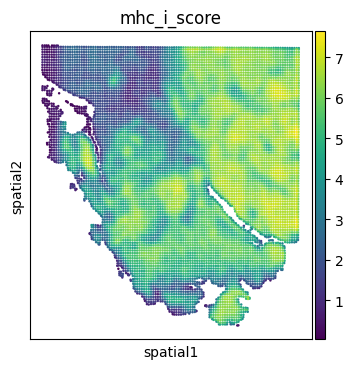

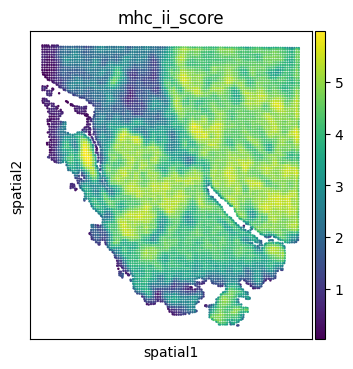

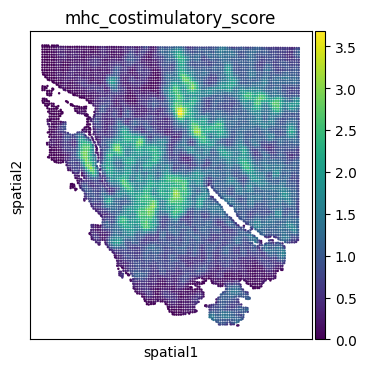

In [49]:
sc.pl.embedding(adata_low, basis="spatial", color="mhc_i_score")
sc.pl.embedding(adata_low, basis="spatial", color="mhc_ii_score")
sc.pl.embedding(adata_low, basis="spatial", color="mhc_costimulatory_score")

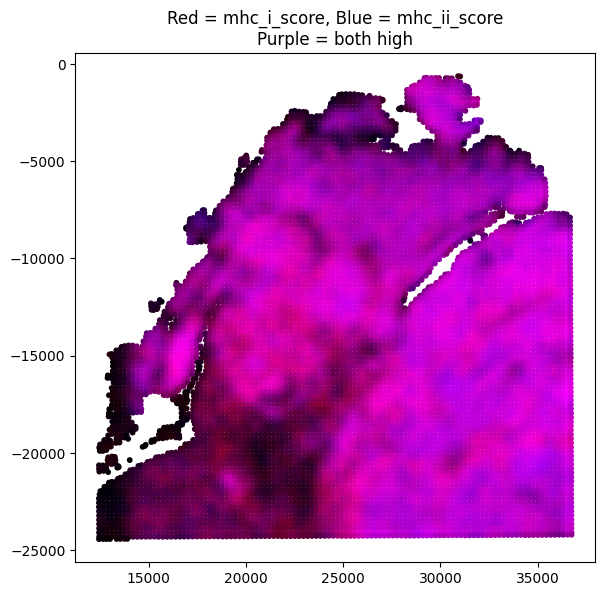

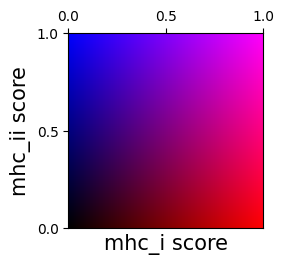

In [50]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import minmax_scale
from matplotlib.patches import Patch
from matplotlib.colors import Normalize

# 1. 점수 가져오기 (NaN → 0 처리)
mhc_i_raw = adata_low.obs["mhc_i_score"].fillna(0).values
mhc_ii_raw = adata_low.obs["mhc_ii_score"].fillna(0).values

# 2. 정규화 함수
def safe_minmax(arr):
    if np.all(arr == arr[0]):
        return np.zeros_like(arr)
    return minmax_scale(arr)

# 3. 정규화된 점수 (0~1 사이)
x = safe_minmax(mhc_i_raw)  # inflam → blue
y = safe_minmax(mhc_ii_raw)    # supp → red

# 4. RGB 색상 생성
r = y
g = np.zeros_like(x)
b = x
rgb = np.clip(np.stack([r, g, b], axis=1), 0, 1)

# 5. 좌표 (Y축 반전)
spatial = adata_low.obsm["spatial"].copy()
spatial[:, 1] = -spatial[:, 1]

# 6. 플롯 본체 + 색상
fig = plt.figure(figsize=(8, 8))
main_ax = fig.add_axes([0.1, 0.1, 0.65, 0.65])  # left, bottom, width, height

main_ax.scatter(spatial[:, 0], spatial[:, 1], c=rgb, s=10)
main_ax.set_title("Red = mhc_i_score, Blue = mhc_ii_score\nPurple = both high")
main_ax.set_aspect('equal')
plt.show()

####################################################
####################################################
####################################################


fig = plt.figure(figsize=(3, 3))  # 원하는 크기 조정 가능

# 하나의 axes (전체 figure를 사용)
cb_ax = fig.add_axes([0.2, 0.2, 0.65, 0.65])  # 내부 위치 조정

# RGB 그리드 구성
res = 100
r_vals = np.linspace(0, 1, res)
b_vals = np.linspace(0, 1, res)
R, B = np.meshgrid(r_vals, b_vals)
G = np.zeros_like(R)
color_grid = np.stack([R, G, B], axis=2)

# 이미지 출력
cb_ax.imshow(color_grid, origin='lower', extent=[0, 1, 0, 1], aspect='auto')

# 라벨 및 제목 설정
cb_ax.set_xlabel("mhc_i score", fontsize=15)
cb_ax.set_ylabel("mhc_ii score", fontsize=15)

cb_ax.xaxis.set_label_position('bottom')
cb_ax.xaxis.tick_top()
cb_ax.set_xticks([0, 0.5, 1])
cb_ax.set_yticks([0, 0.5, 1])

plt.show()


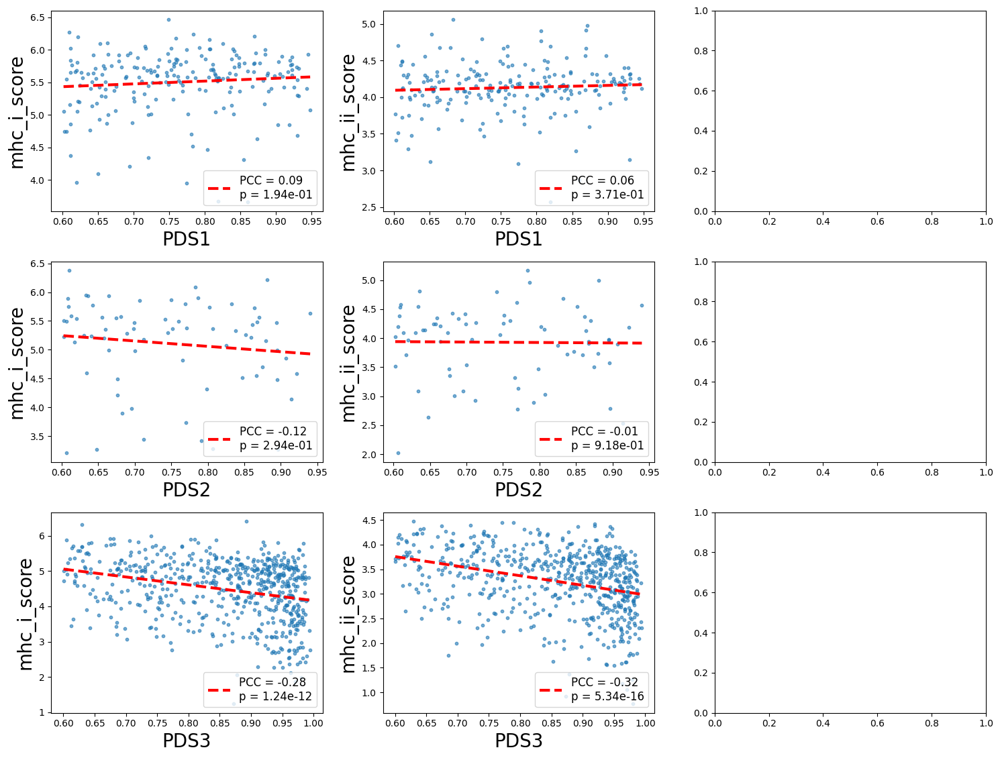

In [53]:
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
import numpy as np

# 조건 필터링: 특정 UnsupervisedL1만 선택
target_celltypes = ['Intestinal Epithelial']
adata_filtered = adata_low[adata_low.obs['UnsupervisedL1'].isin(target_celltypes)]

# 컬럼 이름 매핑
score_cols = ['mhc_i_score', 'mhc_ii_score']
pds_list = ['PDS1', 'PDS2', 'PDS3']

# 그림 설정
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 12), sharex=False, sharey=False)

# 반복적으로 plot
for row_idx, pds in enumerate(pds_list):
    subset = adata_filtered.obs[adata_filtered.obs['PDS'] == pds]
    x_col = pds  # PDS1, PDS2, PDS3 값이 obs에 있어야 함

    for col_idx, y_col in enumerate(score_cols):
        ax = axes[row_idx, col_idx]

        x = subset[x_col].values
        y = subset[y_col].values

        # 상관계수 및 회귀선 계산
        if len(x) > 1 and len(y) > 1 and np.std(x) > 0 and np.std(y) > 0:
            corr, pval = pearsonr(x, y)

            # 회귀선 (1차 직선) 계산
            slope, intercept = np.polyfit(x, y, 1)
            x_fit = np.linspace(min(x), max(x), 100)
            y_fit = slope * x_fit + intercept

            # 추세선 추가 (빨간 점선)
            ax.plot(x_fit, y_fit, 'r--', linewidth=3)
        else:
            corr, pval = np.nan, np.nan

        # 산점도
        ax.scatter(x, y, alpha=0.6, s=10)

        # 축 라벨
        ax.set_xlabel(x_col, fontsize=20)
        ax.set_ylabel(y_col, fontsize=20)

        # 범례 (PCC, p-value)
        legend_text = f"PCC = {corr:.2f}\np = {pval:.2e}"
        ax.legend([legend_text], loc='lower right', fontsize=12)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


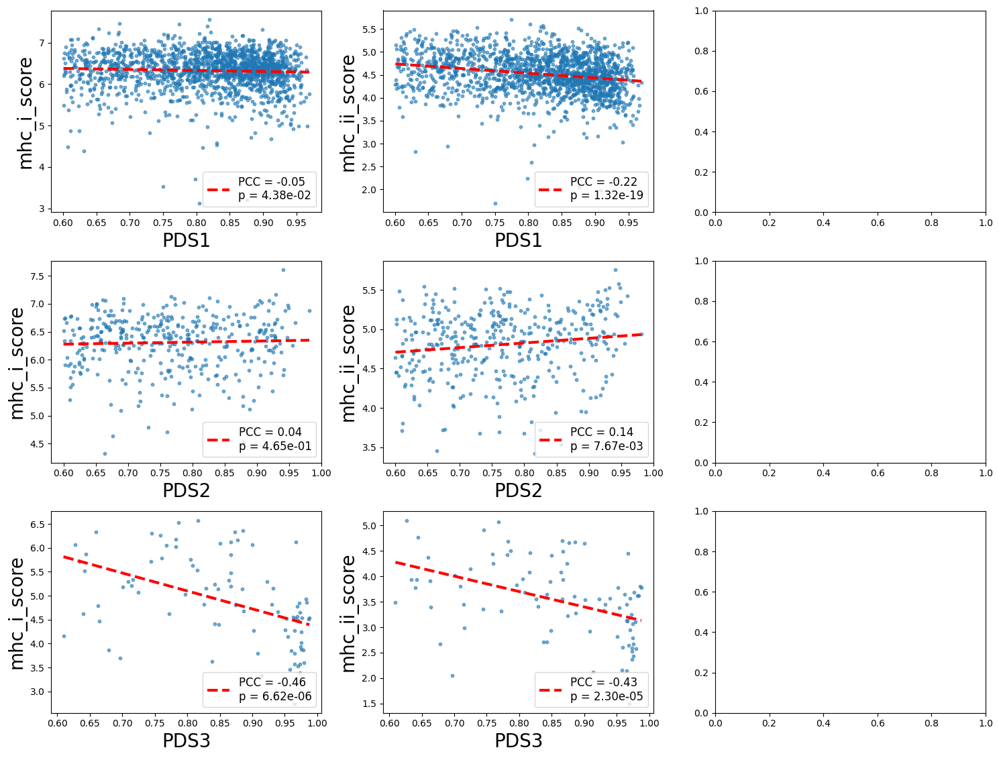

In [54]:
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
import numpy as np

# 조건 필터링: 특정 UnsupervisedL1만 선택
target_celltypes = ['Tumor']
adata_filtered = adata_low[adata_low.obs['UnsupervisedL1'].isin(target_celltypes)]

# 컬럼 이름 매핑
score_cols = ['mhc_i_score', 'mhc_ii_score']
pds_list = ['PDS1', 'PDS2', 'PDS3']

# 그림 설정
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 12), sharex=False, sharey=False)

# 반복적으로 plot
for row_idx, pds in enumerate(pds_list):
    subset = adata_filtered.obs[adata_filtered.obs['PDS'] == pds]
    x_col = pds  # PDS1, PDS2, PDS3 값이 obs에 있어야 함

    for col_idx, y_col in enumerate(score_cols):
        ax = axes[row_idx, col_idx]

        x = subset[x_col].values
        y = subset[y_col].values

        # 상관계수 및 회귀선 계산
        if len(x) > 1 and len(y) > 1 and np.std(x) > 0 and np.std(y) > 0:
            corr, pval = pearsonr(x, y)

            # 회귀선 (1차 직선) 계산
            slope, intercept = np.polyfit(x, y, 1)
            x_fit = np.linspace(min(x), max(x), 100)
            y_fit = slope * x_fit + intercept

            # 추세선 추가 (빨간 점선)
            ax.plot(x_fit, y_fit, 'r--', linewidth=3)
        else:
            corr, pval = np.nan, np.nan

        # 산점도
        ax.scatter(x, y, alpha=0.6, s=10)

        # 축 라벨
        ax.set_xlabel(x_col, fontsize=20)
        ax.set_ylabel(y_col, fontsize=20)

        # 범례 (PCC, p-value)
        legend_text = f"PCC = {corr:.2f}\np = {pval:.2e}"
        ax.legend([legend_text], loc='lower right', fontsize=12)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


In [59]:
save_path = "/home/Data_Drive_8TB/kykim/2. CRC/CRC2/save_point/VisiumHD_GSM8594567_P1CRC.h5ad"

# h5ad 파일로 저장
adata_low.write(save_path)

# Total statistic

/tmp/ipykernel_2278451/2444108232.py:17: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df.groupby('PDS')[score_cols].mean().reset_index()


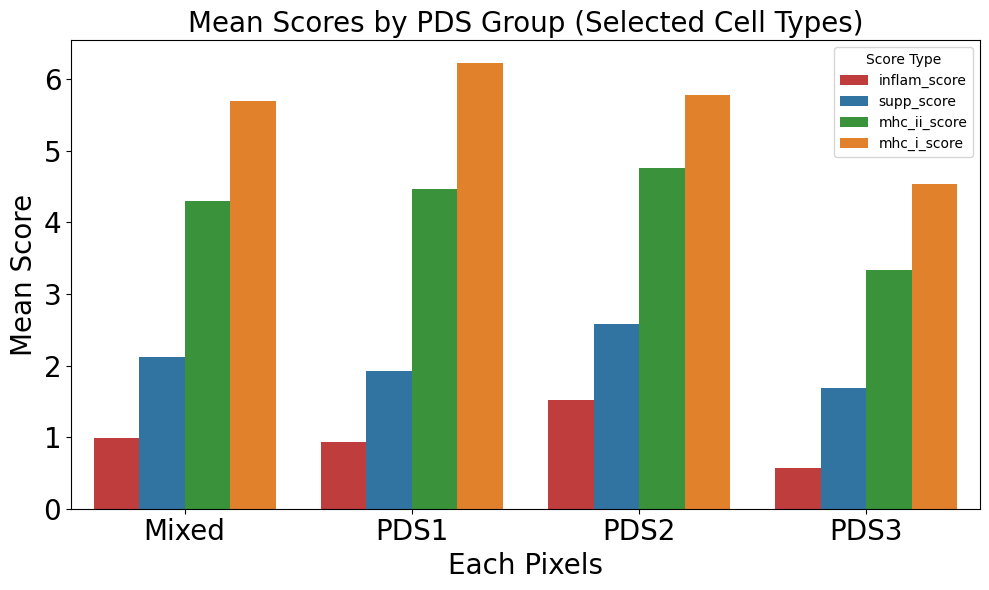

In [65]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 사용할 컬럼
score_cols = ['inflam_score', 'supp_score', 'mhc_ii_score', 'mhc_i_score']

# 조건에 맞는 셀만 필터링
cell_types_of_interest = ['Fibroblast', 'Tumor', 'Intestinal Epithelial']
df = adata_low.obs[adata_low.obs['UnsupervisedL1'].isin(cell_types_of_interest)].copy()

# 필요한 컬럼만 사용
df = df[score_cols + ['PDS']]

# PDS별 평균 점수 계산
grouped = df.groupby('PDS')[score_cols].mean().reset_index()

# 데이터 melt (long-form 형태로 변환)
df_melted = pd.melt(grouped, id_vars='PDS', var_name='Score Type', value_name='Mean Score')

# 색상 설정
score_colors = {
    'inflam_score': '#d62728',
    'supp_score': '#1f77b4',
    'mhc_ii_score': '#2ca02c',
    'mhc_i_score': '#ff7f0e'
}

# 폰트 크기 설정
label_fontsize = 20
title_fontsize = 20
tick_fontsize = 20
legend_fontsize = 10
legend_title_fontsize = 10

# barplot
plt.figure(figsize=(10, 6))
sns.barplot(
    data=df_melted,
    x='PDS',
    y='Mean Score',
    hue='Score Type',
    palette=score_colors
)

plt.title('Mean Scores by PDS Group (Selected Cell Types)', fontsize=title_fontsize)
plt.ylabel('Mean Score', fontsize=label_fontsize)
plt.xlabel('Each Pixels', fontsize=label_fontsize)

# tick label 크기 조정
plt.xticks(fontsize=tick_fontsize)
plt.yticks(fontsize=tick_fontsize)

# 범례(font size 조정)
legend = plt.legend(title='Score Type')
legend.set_title('Score Type', prop={'size': legend_title_fontsize})
for text in legend.get_texts():
    text.set_fontsize(legend_fontsize)

plt.tight_layout()
plt.show()


/tmp/ipykernel_2278451/3310506245.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipykernel_2278451/3310506245.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipykernel_2278451/3310506245.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipykernel_2278451/3310506245.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


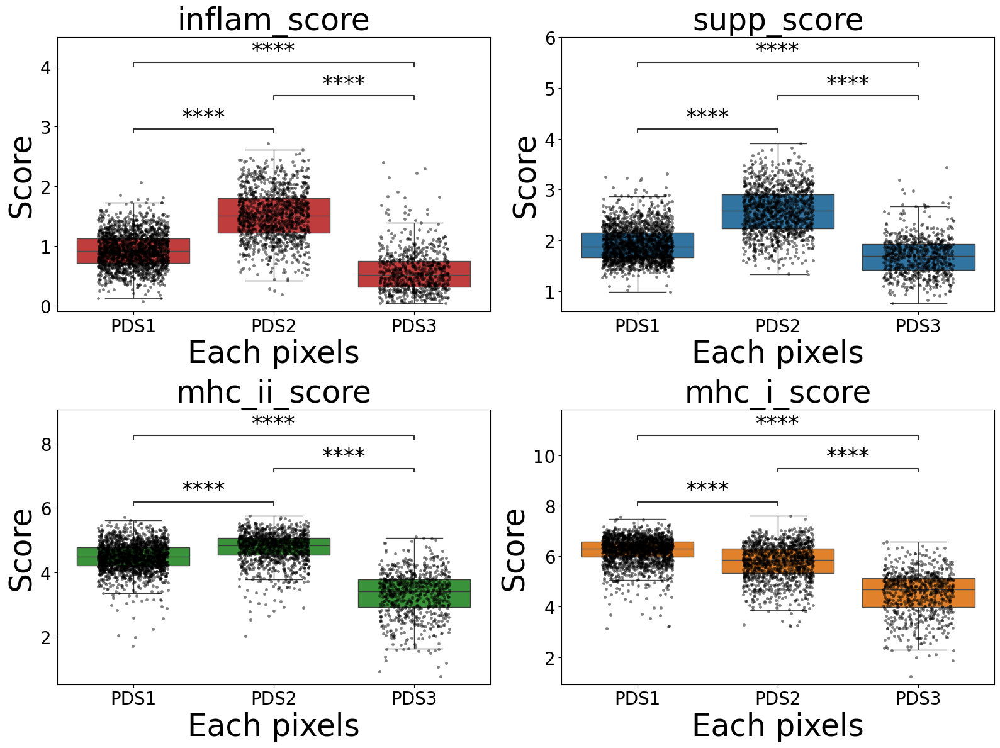

In [69]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from statannotations.Annotator import Annotator

# 사용할 점수 컬럼
score_cols = ['inflam_score', 'supp_score', 'mhc_ii_score', 'mhc_i_score']
cell_types_of_interest = ['Fibroblast', 'Tumor', 'Intestinal Epithelial']

# 조건 필터링: 특정 세포 유형만 선택
df = adata_low.obs[
    adata_low.obs['UnsupervisedL1'].isin(cell_types_of_interest)
][score_cols + ['PDS']].copy()

# PDS 순서 정의 (Mixed 있을 경우 추가)
pds_order = ['PDS1', 'PDS2', 'PDS3']  # 'Mixed' 포함하려면 추가

# 색상 설정 (점수별 boxplot 색)
color_palette = {
    'inflam_score': '#d62728',
    'supp_score': '#1f77b4',
    'mhc_ii_score': '#2ca02c',
    'mhc_i_score': '#ff7f0e'
}

# 폰트 설정
label_fontsize = 35
title_fontsize = 35
tick_fontsize = 20
annotation_fontsize = 25  # 통계검정 결과 별표 크기

# 비교할 PDS 쌍 정의
comparisons = [('PDS1', 'PDS2'), ('PDS2', 'PDS3'), ('PDS1', 'PDS3')]

# 그림 준비
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

for idx, score in enumerate(score_cols):
    ax = axes[idx]

    # boxplot 그리기
    sns.boxplot(
        data=df,
        x='PDS',
        y=score,
        order=pds_order,
        ax=ax,
        palette=[color_palette[score]] * len(pds_order),
        showcaps=True,
        fliersize=0
    )

    # stripplot (dot) 그리기
    sns.stripplot(
        data=df,
        x='PDS',
        y=score,
        order=pds_order,
        ax=ax,
        color='black',
        size=3.5,
        jitter=0.25,
        alpha=0.5
    )

    # 축 제목 및 제목 설정
    ax.set_title(score, fontsize=title_fontsize)
    ax.set_xlabel("Each pixels", fontsize=label_fontsize)
    ax.set_ylabel("Score", fontsize=label_fontsize)
    ax.tick_params(axis='both', labelsize=tick_fontsize)

    # 통계검정 결과 표시 (box 내부에 별표로, 글자 크기 조정)
    annotator = Annotator(ax, comparisons, data=df, x='PDS', y=score, order=pds_order)
    annotator.configure(
        test='t-test_ind',
        text_format='star',
        loc='inside',
        fontsize=annotation_fontsize,
        verbose=0
    )
    annotator.apply_and_annotate()

plt.tight_layout()
plt.show()


In [109]:
adata_PDS = adata_low[
    adata_low.obs['UnsupervisedL1'].isin(['Tumor', 'Intestinal Epithelial']) &
    adata_low.obs['PDS'].isin(['PDS1', 'PDS2', 'PDS3'])
].copy()


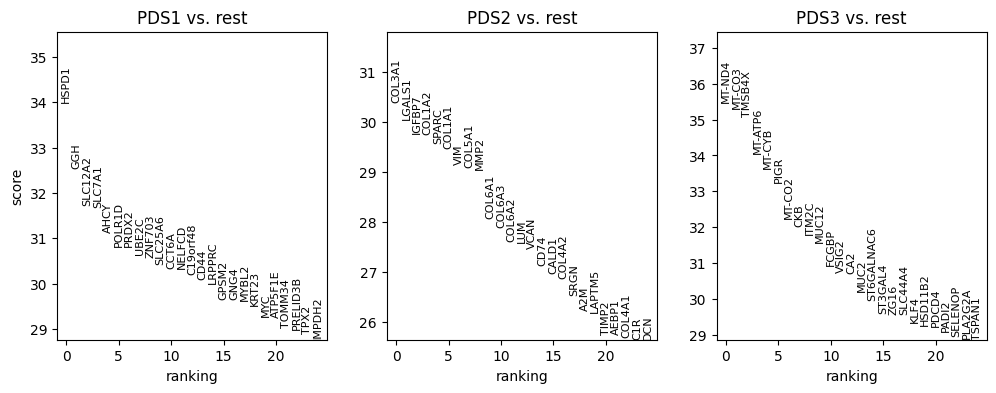

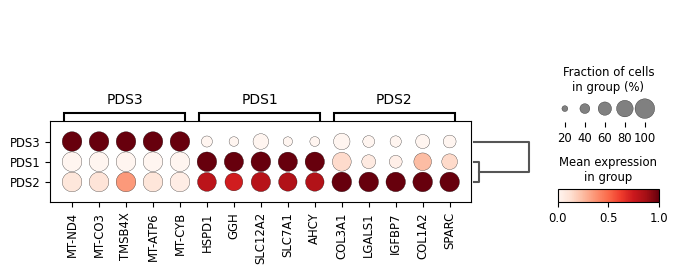

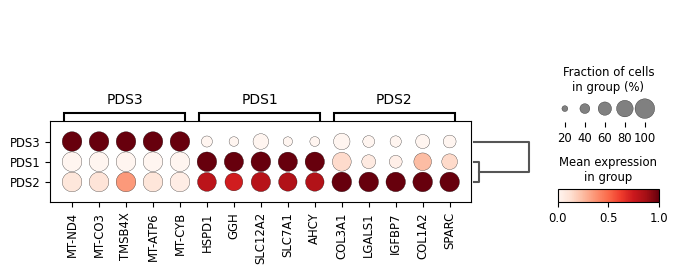

In [110]:
sc.tl.rank_genes_groups(adata_PDS, 'PDS', method="wilcoxon",use_raw =False)
sc.pl.rank_genes_groups(adata_PDS, n_genes=25, sharey=False)
sc.tl.dendrogram(adata_PDS, groupby='PDS')
sc.pl.rank_genes_groups_dotplot(
        adata_PDS, groupby="PDS", standard_scale="var",  n_genes=5, use_raw=False
)
import pandas as pd
import scanpy as sc

# 2. 결과 저장
result = adata_PDS.uns["rank_genes_groups"]
groups = result["names"].dtype.names  # 예: ("Tcells", "Bcells", ...)

# 3. DataFrame 변환
result_df = pd.DataFrame(
    {
        f"{group}_{key}": result[key][group]
        for group in groups
        for key in ["names", "pvals_adj", "logfoldchanges", "scores"]
    }
)

# 4. 결과 저장 딕셔너리
up_dict = {}
down_dict = {}

# 5. 자동 반복 처리
for group in groups:
    n_col = f"{group}_names"
    p_col = f"{group}_pvals_adj"
    l_col = f"{group}_logfoldchanges"
    s_col = f"{group}_scores"

    degs_sig = result_df[result_df[p_col] < 0.05]
    degs_up = degs_sig[degs_sig[l_col] > 1].sort_values(by=s_col, ascending=False)
    degs_dw = degs_sig[degs_sig[l_col] < -1].sort_values(by=s_col, ascending=True)

    # 유전자 이름만 추출
    up_dict[group] = degs_up[n_col].reset_index(drop=True)
    down_dict[group] = degs_dw[n_col].reset_index(drop=True)

# 6. 병합
df_merge_up = pd.concat(up_dict.values(), axis=1)
df_merge_up.columns = list(up_dict.keys())  # 각 열 이름을 group 이름으로

df_merge_down = pd.concat(down_dict.values(), axis=1)
df_merge_down.columns = list(down_dict.keys())

sc.tl.dendrogram(adata_PDS, groupby='PDS')
sc.pl.rank_genes_groups_dotplot(
        adata_PDS, groupby="PDS", standard_scale="var",  n_genes=5, use_raw=False
)

In [111]:
import pandas as pd
import scanpy as sc

# 2. 결과 저장
result = adata_PDS.uns["rank_genes_groups"]
groups = result["names"].dtype.names  # 예: ("Tcells", "Bcells", ...)

# 3. DataFrame 변환
result_df = pd.DataFrame(
    {
        f"{group}_{key}": result[key][group]
        for group in groups
        for key in ["names", "pvals_adj", "logfoldchanges", "scores"]
    }
)

# 4. 결과 저장 딕셔너리
up_dict = {}
down_dict = {}

# 5. 자동 반복 처리
for group in groups:
    n_col = f"{group}_names"
    p_col = f"{group}_pvals_adj"
    l_col = f"{group}_logfoldchanges"
    s_col = f"{group}_scores"

    degs_sig = result_df[result_df[p_col] < 0.05]
    degs_up = degs_sig[degs_sig[l_col] > 1].sort_values(by=s_col, ascending=False)
    degs_dw = degs_sig[degs_sig[l_col] < -1].sort_values(by=s_col, ascending=True)

    # 유전자 이름만 추출
    up_dict[group] = degs_up[n_col].reset_index(drop=True)
    down_dict[group] = degs_dw[n_col].reset_index(drop=True)

# 6. 병합
df_merge_up = pd.concat(up_dict.values(), axis=1)
df_merge_up.columns = list(up_dict.keys())  # 각 열 이름을 group 이름으로

df_merge_down = pd.concat(down_dict.values(), axis=1)
df_merge_down.columns = list(down_dict.keys())

In [112]:
from qed.data import readtxt, readseurat, readscanpy
from qed.data import get_enrichment_dataframes
from qed.data import merge_df
from qed.data import query
import inspect


In [113]:
import pandas as pd

# ✅ 사용자 정의 GeneSet 클래스
class GeneSet:
    def __init__(self, genes, name, annot=None):
        self.genes = genes
        self.name = name
        self.params = {}
        self.GO = []
        self.annot = annot or {}

# ✅ enrichment에 사용할 데이터베이스 목록
dblist = [
    'KEGG_2021_Human',
    'Reactome_2022',
    'MSigDB_Hallmark_2020',
    'GO_Biological_Process_2023',
    'WikiPathway_2024_Human'
]

# ✅ DEG 테이블 상위 20개 추출 및 저장
df_merge_up_100 = df_merge_up.head(20)
df_merge_up_100.to_csv('breast_cancer_DEG_up_leiden.csv', index=False, header=True)

# ✅ CSV 불러오기
alist = pd.read_csv('breast_cancer_DEG_up_leiden.csv')

# ✅ 각 열마다 GeneSet 객체로 변환
geneset_list = []
for col in alist.columns:
    genes = alist[col].dropna().tolist()
    gs = GeneSet(genes=genes, name=col, annot={"Leiden": col})
    geneset_list.append(gs)

# ✅ enrichment 실행
aalist = get_enrichment_dataframes(
    geneset_list=geneset_list,
    dblist=dblist,
    annot_colname="Leiden",
    n_jobs=None,
    handle_error=True,
    max_iter=1
)

# ✅ 결과 병합 및 후처리
df = merge_df(aalist)
df['Term'] = df['Term'].str.split(r'\(GO:').str[0].str.strip()
df['Term'] = df['Term'].str.split('R-H').str[0].str.strip()
df['Term'] = df['Term'].str.split('WP').str[0].str.strip()


Processing genesets: 9it [00:01,  8.18it/s]                       

Error processing PDS1 for WikiPathway_2024_Human: 'WikiPathway_2024_Human'
Error processing PDS2 for WikiPathway_2024_Human: 'WikiPathway_2024_Human'
Error processing PDS3 for WikiPathway_2024_Human: 'WikiPathway_2024_Human'


Processing genesets: 15it [00:01,  8.77it/s]


Trying to re-request...
Error processing PDS1 for WikiPathway_2024_Human: 'WikiPathway_2024_Human'
PDS1 with WikiPathway_2024_Human completed!
Error processing PDS2 for WikiPathway_2024_Human: 'WikiPathway_2024_Human'
PDS2 with WikiPathway_2024_Human completed!
Error processing PDS3 for WikiPathway_2024_Human: 'WikiPathway_2024_Human'
PDS3 with WikiPathway_2024_Human completed!


In [114]:
from typing import List, Tuple, Dict
def heatmap_with_groupwise_ordering(df: pd.DataFrame,
                                     n: int,
                                     group_by: str,
                                     order_by: str = "Adjusted p-value",
                                     cmap: str = 'Blues',
                                     xlabel_rotation: int = 90,
                                     xlabel_fontsize: int = 15,
                                     ylabel_fontsize: int = 15,
                                     figsize: Tuple = (15, 10),
                                     vmin: float = None,
                                     vmax: float = None,
                                     cbar_kws: Dict = None,
                                     linewidths: float = 0.1,
                                     title: str = None,
                                     save_to_file: str = None,
                                     enable_column_order: bool = False,
                                     column_order: list = None,
                                     enable_highlight_columns: bool = False,
                                     highlight_column_names: list = None):

    if not isinstance(df, pd.DataFrame):
        raise TypeError("입력 'df'는 pandas DataFrame이어야 합니다.")
    if group_by not in df.columns:
        raise ValueError(f"'{group_by}' 컬럼이 DataFrame에 존재하지 않습니다.")
    if order_by not in df.columns:
        raise ValueError(f"'{order_by}' 컬럼이 DataFrame에 존재하지 않습니다.")
    if 'Term' not in df.columns:
        raise ValueError("'Term' 컬럼이 DataFrame에 존재하지 않습니다.")

    has_overlapping_genes = 'Overlapping genes' in df.columns

    # P-value 컬럼 숫자형 강제 변환
    df_copy = df.copy()
    df_copy[order_by] = pd.to_numeric(df_copy[order_by], errors='coerce')
    df = df_copy

    df['Term_lower'] = df['Term'].str.lower()

    # 상위 n개 Term 추출
    df_filtered_by_order = df[df[order_by].notna()]
    df_ranked_per_group = (
        df_filtered_by_order
        .sort_values(order_by)
        .groupby(group_by)
        .head(n)
        .reset_index(drop=True)
    )
    if df_ranked_per_group.empty:
        print(f"⚠️ 각 그룹에서 상위 {n}개의 Term을 선택할 수 없습니다.")
        return None, None

    all_selected_terms_lower = df_ranked_per_group['Term_lower'].unique()

    # Overlapping genes 처리
    overlapping_genes_pivot = pd.DataFrame()
    if has_overlapping_genes:
        overlapping_genes_df = df[df['Term_lower'].isin(all_selected_terms_lower)][['Term_lower', group_by, 'Overlapping genes']]
        overlapping_genes_df['Overlapping genes'] = overlapping_genes_df['Overlapping genes'].apply(
            lambda x: ', '.join(map(str, x)) if isinstance(x, list) else str(x)
        )
        overlapping_genes_df = overlapping_genes_df.groupby(['Term_lower', group_by])['Overlapping genes'].apply(', '.join).reset_index()
        overlapping_genes_df.rename(columns={'Term_lower': 'Term'}, inplace=True)
        overlapping_genes_pivot = overlapping_genes_df.pivot(index='Term', columns=group_by, values='Overlapping genes').fillna('')
        overlapping_genes_pivot.index = overlapping_genes_pivot.index.map(lambda x: x.capitalize())

    # P-value pivot table
    aggregated_df = df[df['Term_lower'].isin(all_selected_terms_lower)].groupby(['Term_lower', group_by], as_index=False)[order_by].min()
    aggregated_df.rename(columns={'Term_lower': 'Term'}, inplace=True)
    pivot_df = aggregated_df.pivot(index="Term", columns=group_by, values=order_by).fillna(1).rename_axis(None, axis=1)

    # Log 변환
    is_pvalue_column = order_by.lower() in ['adjusted p-value', 'p-value']
    pivot_df_for_heatmap = -np.log10(np.maximum(pivot_df, np.finfo(float).eps)) if is_pvalue_column else pivot_df.copy()
    pivot_df_for_heatmap.index = pivot_df_for_heatmap.index.map(lambda x: x.capitalize())

    # ✅ Overlapping genes와 결합
    final_pivot_df = pd.concat([pivot_df_for_heatmap, overlapping_genes_pivot], axis=1)

    if save_to_file:
        try:
            final_pivot_df.to_csv(save_to_file, encoding='utf-8-sig')
            print(f"✅ 히트맵 데이터 저장 완료: '{save_to_file}'")
        except Exception as e:
            print(f"❌ 저장 실패: {e}")

    # ✅ column_order 기준 row 정렬
    row_order = []
    seen_terms = set()

    if enable_column_order and column_order:
        group_order_for_plot = [group for group in column_order if group in df[group_by].unique()]
    else:
        group_order_for_plot = df[group_by].unique()

    for group in group_order_for_plot:
        current_group_terms = df_ranked_per_group[df_ranked_per_group[group_by] == group].sort_values(order_by)
        for term_lower_val in current_group_terms['Term_lower']:
            capitalized_term = term_lower_val.capitalize()
            if capitalized_term in pivot_df_for_heatmap.index and capitalized_term not in seen_terms:
                row_order.append(capitalized_term)
                seen_terms.add(capitalized_term)

    clustered_data = final_pivot_df.loc[row_order]
    heatmap_data = clustered_data.select_dtypes(include=[np.number])
   # 1️⃣ 사용자 지정 column_order가 있으면 그 순서 적용
    if enable_column_order and column_order:
        valid_cols = [c for c in column_order if c in heatmap_data.columns]
        if valid_cols:
            heatmap_data = heatmap_data[valid_cols]

# 2️⃣ column_order가 없고, 열 이름이 전부 숫자로 해석 가능하면 오름차순 정렬
    else:
        try:
        # 모든 열 이름을 float으로 바꿔 보고 성공하면 오름차순 재정렬
            numeric_col_keys = [float(c) for c in heatmap_data.columns]
            sorted_cols = [col for _, col in sorted(zip(numeric_col_keys, heatmap_data.columns))]
            heatmap_data = heatmap_data[sorted_cols]
        except ValueError:
        # 열 이름이 숫자가 아닌 게 섞여 있으면 그대로 둡니다
            pass


    if is_pvalue_column:
        p_values_for_annotation = 10 ** (-np.clip(heatmap_data, None, 300))
        annotations = np.where(p_values_for_annotation <= 0.05, '*', '')
        annotations = annotations.astype(object)
    else:
        annotations = False

    # ✅ 열 강조 인덱스 계산 (선 추가)
    highlight_column_indices = []
    if enable_highlight_columns and highlight_column_names:
        highlight_column_indices = [
            list(heatmap_data.columns).index(col)
            for col in highlight_column_names if col in heatmap_data.columns
        ]

    # ✅ 시각화
    fig, ax = plt.subplots(figsize=figsize)
    sns.heatmap(heatmap_data, cmap=cmap, vmin=vmin, vmax=vmax,
                linewidths=linewidths, annot=annotations, fmt='',
                linecolor='white', ax=ax, cbar_kws=cbar_kws, square=True,
                annot_kws={"size": 12, "color": "white", "weight": "bold"})

    # 수직선 추가
    for x in highlight_column_indices:
        ax.vlines(x + 1, *ax.get_ylim(), colors='black', linewidth=2)

    plt.xticks(rotation=xlabel_rotation, fontsize=xlabel_fontsize)
    plt.yticks(fontsize=ylabel_fontsize)
    if title:
        ax.set_title(title, fontsize=18, pad=20)
    plt.grid(False)

    if 'Term_lower' in df.columns:
        df.drop(columns='Term_lower', inplace=True)

    return fig, ax

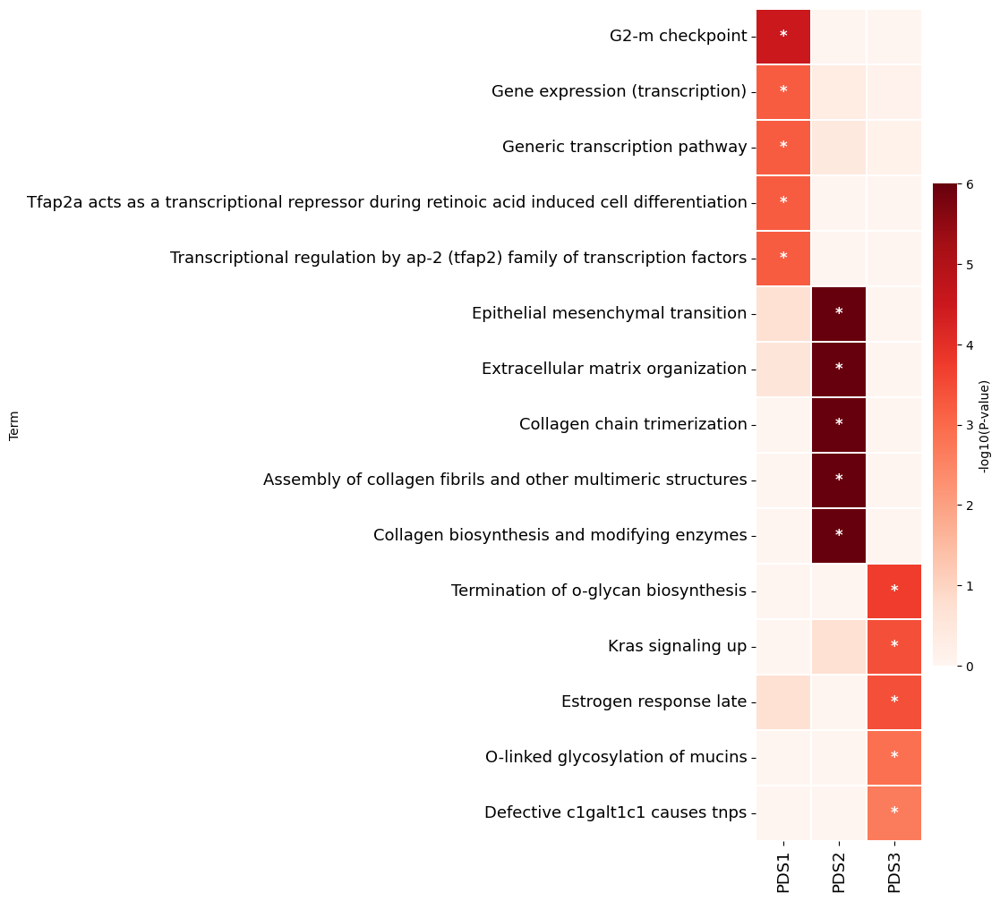

In [122]:
fig, ax = heatmap_with_groupwise_ordering(
    df= df,
    n=5,
    group_by='Leiden',
    order_by="Adjusted p-value",
    cmap='Reds',
    xlabel_rotation=90,
    xlabel_fontsize=13,
    ylabel_fontsize=13,
    figsize=(3, 14),
    vmin=0, vmax=6,
    cbar_kws={'shrink': 0.5, 'label': '-log10(P-value)'},
    enable_column_order=False,
   # column_order=[
   #     "Contractile cardiomyocyte", 
   #     "Myogenerative cardiomyocyte", 
   #     "Inflammatory cardiomyocyte"
   # ],
    enable_highlight_columns=False,
   # highlight_column_names=[
   #     "Contractile cardiomyocyte", 
   #     "Inflammatory cardiomyocyte"
   # ]
)

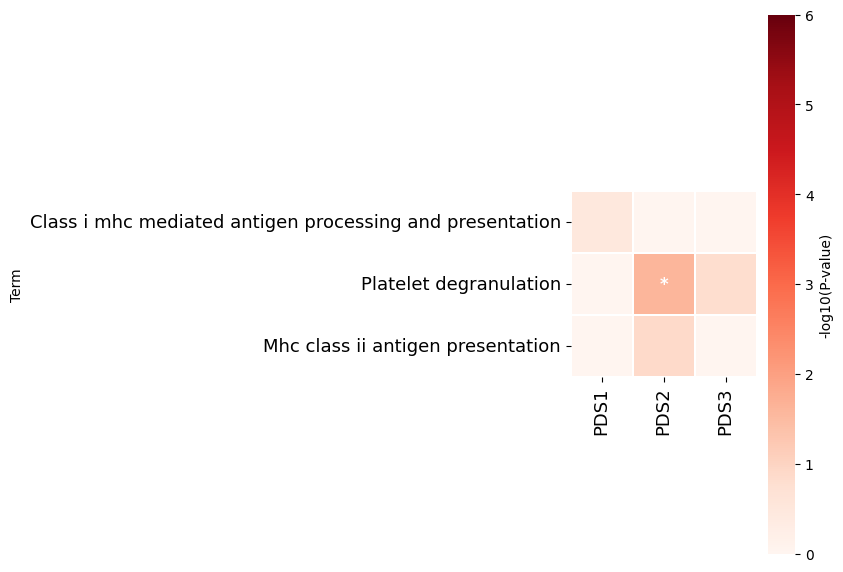

In [127]:
# 원하는 pathway 리스트
target_pathways = [
    "Class I MHC Mediated Antigen Processing And Presentation",
    "MHC Class II Antigen Presentation",
    "Platelet Degranulation"
]

# df에서 해당 pathway들만 필터링 (Term 컬럼명 가정)
df_mhc = df[df['Term'].isin(target_pathways)]

# 필터링한 데이터로 heatmap 호출
fig, ax = heatmap_with_groupwise_ordering(
    df=df_mhc,
    n=5,
    group_by='Leiden',
    order_by="Adjusted p-value",
    cmap='Reds',
    xlabel_rotation=90,
    xlabel_fontsize=13,
    ylabel_fontsize=13,
    figsize=(3, 14),
    vmin=0, vmax=6,
    cbar_kws={'shrink': 0.5, 'label': '-log10(P-value)'},
    enable_column_order=False,
    enable_highlight_columns=False,
)


# Inflammotory / Immunosuppressive score (Dot base)

In [43]:
import numpy as np

# 유전자 리스트
immuno_genes = [
    "NT5E", "ENTPD1", "CTLA4", "HIF1A", "IL10", "IL17A", "IL1B", "CXCL8", "LAG3",
    "CD274", "PDCD1LG2", "TGFB1", "HAVCR2", "VEGFA", "B2M"
]
inflam_genes = [
    "C1QA", "C1QB", "C1QC", "C5", "IFNG", "IL12A", "IL12B", "IL15", "IL17F", "IL2",
    "IL23A", "IL33", "IL6", "TNF"
]
antipres_genes = [
    "B2M", "TAP1", "TAP2", "PSMB8", "PSMB9", "NLRC5", "IRF1", "STAT1"
]

# adata.var_names 기준 해당 유전자 인덱스 추출
def get_gene_indices(adata, gene_list):
    return [i for i, g in enumerate(adata.var_names) if g in gene_list]

supp_idx = get_gene_indices(adata_low, immuno_genes)
inflam_idx = get_gene_indices(adata_low, inflam_genes)
antipres_idx = get_gene_indices(adata_low, antipres_genes)

# 유전자 점수 계산 함수 (전체 dot에 대해)
def calc_dot_gene_score(adata, gene_idx):
    submatrix = adata.X[:, gene_idx]
    if hasattr(submatrix, "toarray"):
        submatrix = submatrix.toarray()
    return np.mean(submatrix, axis=1)

# 각각 점수 계산하여 obs에 추가
adata_low.obs["dot_supp_score"] = calc_dot_gene_score(adata_low, supp_idx)
adata_low.obs["dot_inflam_score"] = calc_dot_gene_score(adata_low, inflam_idx)
adata_low.obs["dot_antipres_idx_score"] = calc_dot_gene_score(adata_low, antipres_idx)

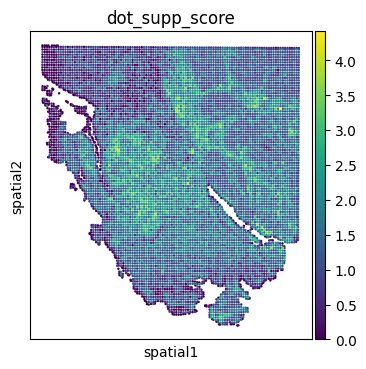

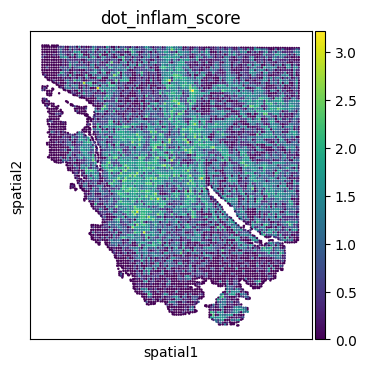

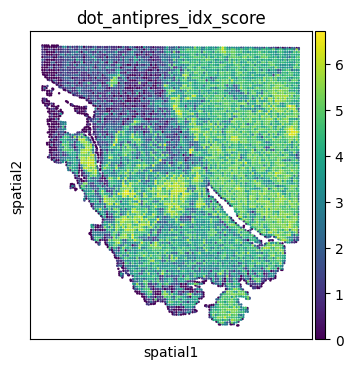

In [44]:
sc.pl.embedding(adata_low, basis="spatial", color="dot_supp_score")
sc.pl.embedding(adata_low, basis="spatial", color="dot_inflam_score")
sc.pl.embedding(adata_low, basis="spatial", color="dot_antipres_idx_score")

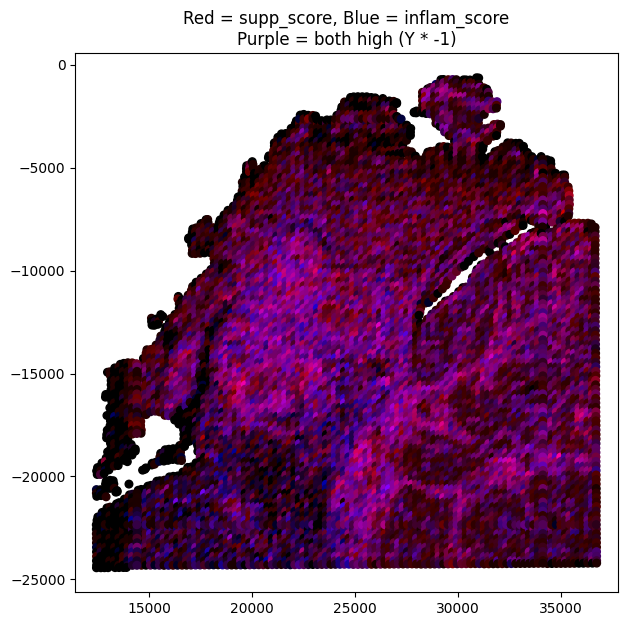

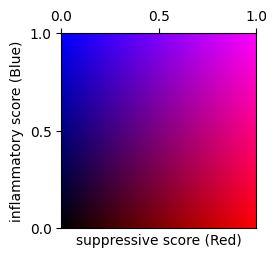

In [45]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import minmax_scale
from matplotlib.patches import Patch

# 1. 점수 가져오기 (NaN → 0 처리)
inflam_raw = adata_low.obs["dot_inflam_score"].fillna(0).values
supp_raw = adata_low.obs["dot_supp_score"].fillna(0).values

# 2. 정규화 함수 (값이 동일할 때 오류 방지)
def safe_minmax(arr):
    if np.all(arr == arr[0]):
        return np.zeros_like(arr)
    return minmax_scale(arr)

# 3. 정규화된 점수
x = safe_minmax(inflam_raw)  # inflam → blue
y = safe_minmax(supp_raw)    # supp → red

# 4. RGB 구성 (green 제거)
r = y
g = np.zeros_like(x)
b = x
rgb = np.clip(np.stack([r, g, b], axis=1), 0, 1)

# 5. 좌표 (Y축에 음수 부호 붙이기)
spatial = adata_low.obsm["spatial"].copy()
spatial[:, 1] = -spatial[:, 1]

# 6. 플롯
plt.figure(figsize=(7, 7))
plt.scatter(spatial[:, 0], spatial[:, 1], c=rgb, s=30)
plt.title("Red = supp_score, Blue = inflam_score\nPurple = both high (Y * -1)")
plt.axis('equal')


plt.show()
####################################################
####################################################
####################################################


fig = plt.figure(figsize=(3, 3))  # 원하는 크기 조정 가능

# 하나의 axes (전체 figure를 사용)
cb_ax = fig.add_axes([0.2, 0.2, 0.65, 0.65])  # 내부 위치 조정

# RGB 그리드 구성
res = 100
r_vals = np.linspace(0, 1, res)
b_vals = np.linspace(0, 1, res)
R, B = np.meshgrid(r_vals, b_vals)
G = np.zeros_like(R)
color_grid = np.stack([R, G, B], axis=2)

# 이미지 출력
cb_ax.imshow(color_grid, origin='lower', extent=[0, 1, 0, 1], aspect='auto')

# 라벨 및 제목 설정
cb_ax.set_xlabel("suppressive score (Red)", fontsize=10)
cb_ax.set_ylabel("inflammatory score (Blue)", fontsize=10)

cb_ax.xaxis.set_label_position('bottom')
cb_ax.xaxis.tick_top()
cb_ax.set_xticks([0, 0.5, 1])
cb_ax.set_yticks([0, 0.5, 1])

plt.show()


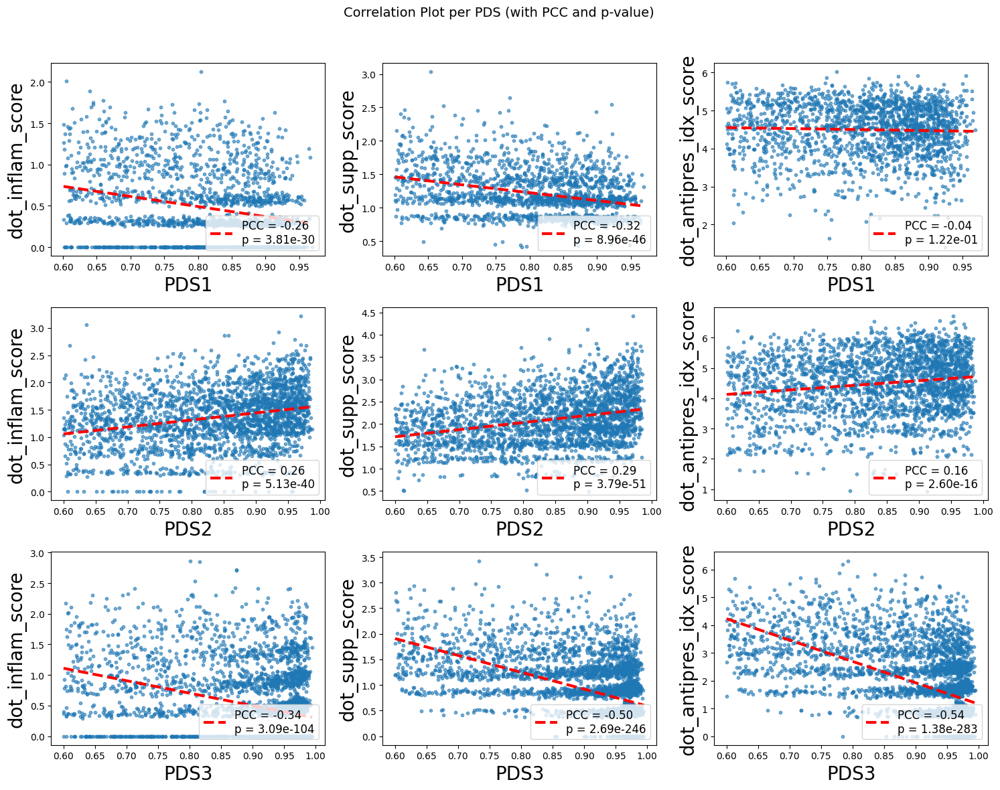

In [90]:
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
import numpy as np

# 컬럼 이름 매핑
score_cols = ['dot_inflam_score', 'dot_supp_score', 'dot_antipres_idx_score']
pds_list = ['PDS1', 'PDS2', 'PDS3']

# 그림 설정
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 12), sharex=False, sharey=False)
fig.suptitle("Correlation Plot per PDS (with PCC and p-value)", fontsize=14)

# 반복적으로 plot
for row_idx, pds in enumerate(pds_list):
    subset = adata_low.obs[adata_low.obs['PDS'] == pds]
    x_col = pds

    for col_idx, y_col in enumerate(score_cols):
        ax = axes[row_idx, col_idx]

        x = subset[x_col].values
        y = subset[y_col].values

        # 상관계수 및 회귀선 계산
        if len(x) > 1 and len(y) > 1 and np.std(x) > 0 and np.std(y) > 0:
            corr, pval = pearsonr(x, y)

            # 회귀선 (1차 직선) 계산
            slope, intercept = np.polyfit(x, y, 1)
            x_fit = np.linspace(min(x), max(x), 100)
            y_fit = slope * x_fit + intercept

            # 추세선 추가 (빨간 점선)
            ax.plot(x_fit, y_fit, 'r--', linewidth=3)
        else:
            corr, pval = np.nan, np.nan

        # 산점도
        ax.scatter(x, y, alpha=0.6, s=10)

        # 축 라벨
        ax.set_xlabel(x_col, fontsize=20)
        ax.set_ylabel(y_col, fontsize=20)

        # 범례 (PCC, p-value)
        legend_text = f"PCC = {corr:.2f}\np = {pval:.2e}"
        ax.legend([legend_text], loc='lower right', fontsize=12)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()
